# Model Testing with RNN's

In this notebook, we will explore and evaluate various RNN-based architectures for predicting negotiation outcomes. Our goal is to compare the performance of different RNN models, including:

- LSTM (Long Short-Term Memory)
- Standard RNN
- GRU (Gated Recurrent Unit)
- Elman RNN

Tghe Goal is to identify the best performing architecture for our dataset while testing the impact of two types of embedding:
- Pre Trained Word2Vec Embedding
- Self trained Word2Vec Embedding

In [1]:
# Basic packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# For Text processing
import string
import re
import warnings
warnings.filterwarnings('ignore')

# Install and import nltk and upprade if necessary libraries
%pip install nltk
import nltk
%pip install --upgrade pandas
%pip install openpyxl --upgrade

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
# After reading the xsl file we find 4 missing values in the column 'Content'
df = pd.read_excel('df_without_greetings_and_closings.xlsx')
df.head()
df.isna().sum()
  

SenderID             0
ReceiverID           0
ActionType           0
NegoOutcome          0
Content              2
length               0
WordCount_basic      0
Content_Length       0
Sentence_Count       0
Word_Count_nltk      0
NegoOutcomeLabel     0
Sentiment            0
SentimentCategory    0
dtype: int64

First of all we will continue using our df_complete_cleansing dataset to ensure same data for our traditional and RNN Models to look which ones perform better.

In [3]:
# Calculate the cumulative length of each exchanged message
df['Negotiation_Content_Length_sum'] = df.groupby(['SenderID', 'ReceiverID'])['Content_Length'].cumsum()

In [4]:
# Initialize a new column for negotiation length
df['Negotiation_Length'] = 0

# Function to calculate negotiation length
def calculate_negotiation_length(group):
    length = 0
    for i, row in group.iterrows():
        length += 1
        df.at[i, 'Negotiation_Length'] = length
        if row['ActionType'] in ['FinalAccept', 'FinalReject']:
            break

# Apply the function to each group of SenderID and ReceiverID
df.groupby(['SenderID', 'ReceiverID']).apply(calculate_negotiation_length)

# Display the DataFrame for verification focus on cell 6-7
#df.head(30)

""


SenderID 70 sent two counteroffers one after another is this an error in the system or is it possible since in the end he has a total of 8 sent messages and receiver 69 only 6. We will check if the sender id and receiver id follow the strict order of being a b a b instead of a a b a b a b b a. Cell 6 - 7 example.

In [5]:
import pandas as pd

# Count rows with missing values
na_rows = df[df['Content'].isna()]
print(na_rows)

      SenderID  ReceiverID    ActionType  NegoOutcome Content  length  \
857       3457        3458  Counteroffer  FinalAccept     NaN       1   
1404       133         134   FinalReject  FinalReject     NaN       1   

      WordCount_basic  Content_Length  Sentence_Count  Word_Count_nltk  \
857                 1               1               1                1   
1404                1               1               1                1   

      NegoOutcomeLabel  Sentiment SentimentCategory  \
857                  1        0.0           Neutral   
1404                 0        0.0           Neutral   

      Negotiation_Content_Length_sum  Negotiation_Length  
857                                1                   1  
1404                             171                   3  


In [6]:
import pandas as pd

# Remove rows with NaN in Content
df = df.dropna(subset=['Content'])

# Remove rows with empty strings or insignificant content in Content
def is_insignificant_content(content):
    return content.strip() == '' or content.strip() == '.' or len(content.split()) == 1

df = df[~df['Content'].apply(is_insignificant_content)]

# Validate Content Length (optional, if Content_Length column is used)
df['Content_Length'] = df['Content'].apply(len)

# Word Embedding Pre-Trained Model

Now we will start with our Pre-trained Word2Vec Embedding Method.

In [7]:
# Schritt 1: Vorverarbeitung und Tokenisierung
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize

nego_message_data = df["Content"]
df_nego_message_data = pd.DataFrame(nego_message_data)

# Laden des "punkt"-Modells, falls nicht bereits vorhanden
nltk.download('punkt')

# Tokenisierung des Inhalts
df_nego_message_data['Tokenized_Content'] = df_nego_message_data['Content'].apply(word_tokenize)

# Konvertiere die tokenisierten Inhalte in eine Liste
sentences = df_nego_message_data['Tokenized_Content'].tolist()
print(sentences)  # Überprüfen der Ergebnisse

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/tarkanyildirim/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


[['dear', 'mr', 'mendel', 'hope', 'you', 'are', 'doing', 'well', 'as', 'the', 'management', 'of', 'both', 'our', 'companies', 'have', 'agreed', 'on', 'building', 'a', 'fruitful', 'partnership', 'to', 'face', 'the', 'upcoming', 'disruptions', 'in', 'our', 'market', 'best', 'with', 'the', 'innovation', 'of', 'green', 'spirit', 'i', 'would', 'like', 'to', 'introduce', 'myself', 'as', 'sasa', 'novak', 'reaching', 'out', 'to', 'you', 'to', 'tighten', 'the', 'general', 'terms', 'hurm', 'ag', 'and', 'svn', 'tech', 'have', 'established', 'in', 'their', 'first', 'round', 'of', 'discussions', 'so', 'far', 'please', 'find', 'attached', 'a', 'proposal', 'for', 'the', 'open', 'issues', 'of', 'our', 'joint', 'venture', 'which', 'i', 'would', 'like', 'to', 'explain', 'to', 'you', 'as', 'following', 'directors', 'first', 'we', 'would', 'like', 'to', 'address', 'the', 'unsolved', 'the', 'issue', 'of', 'the', 'number', 'of', 'directors', 'that', 'are', 'sent', 'by', 'hurm', 'ag', 'and', 'svn', 'tech', '

In [8]:
# Schritt 2: Word2Vec-Embedding laden
# Laden des Word2Vec-Sample-Modells von NLTK
nltk.download("word2vec_sample")

# Installation von gensim (falls nicht bereits installiert)
# %pip install gensim

import gensim
from nltk.data import find


[nltk_data] Downloading package word2vec_sample to
[nltk_data]     /Users/tarkanyildirim/nltk_data...
[nltk_data]   Package word2vec_sample is already up-to-date!


In [9]:
# Word2Vec-Sample-Modell laden
word2vec_sample = str(find('models/word2vec_sample/pruned.word2vec.txt'))
pre_w2v_model = gensim.models.KeyedVectors.load_word2vec_format(word2vec_sample, binary=False)

# Modellinformationen überprüfen
print(f"Anzahl der Schlüssel im Modell: {len(pre_w2v_model.key_to_index)}")
print(f"Vektorgröße für 'negotiation': {len(pre_w2v_model['negotiation'])}")

# Ähnlichkeitsberechnungen
print(pre_w2v_model.most_similar(positive=["negotiation"], topn=20))
print(pre_w2v_model.most_similar(positive=["negotiation"], negative=["agreement"], topn=10))

# Beispiel: Zugriff auf den Vektor eines Wortes
print(pre_w2v_model["negotiation"])

Anzahl der Schlüssel im Modell: 43981
Vektorgröße für 'negotiation': 300
[('negotiations', 0.816856861114502), ('negotiating', 0.7531847357749939), ('bargaining', 0.6434566378593445), ('negotiate', 0.6341554522514343), ('negotiated', 0.6292652487754822), ('talks', 0.6133744716644287), ('discussions', 0.6095365881919861), ('dialogue', 0.5417248606681824), ('haggling', 0.5341888070106506), ('agreement', 0.501986026763916), ('impasse', 0.4880932867527008), ('consultations', 0.4769951105117798), ('discussion', 0.465476393699646), ('compromise', 0.454706072807312), ('Discussions', 0.4485512673854828), ('brinkmanship', 0.44761836528778076), ('agreements', 0.4455186724662781), ('ratification', 0.4414721429347992), ('preconditions', 0.435526579618454), ('tripartite', 0.4344906210899353)]
[('diplomacy', 0.323906272649765), ('dialogue', 0.29187703132629395), ('Interviewing', 0.28622379899024963), ('politicking', 0.28376880288124084), ('tactful', 0.2724672555923462), ('debates', 0.272152364253997

## LSTM

### Preparing the Data with Pre-trained Embeddings

In this step, we aim to improve the accuracy and efficiency of predicting negotiation outcomes using advanced RNN models. To achieve this, we utilize **pre-trained Word2Vec embeddings** for the following reasons:

1. **Leverage Pre-trained Knowledge**:
   Pre-trained embeddings provide rich semantic information about words, learned from large datasets. This reduces the need for training embeddings from scratch, especially when working with smaller datasets.

2. **Consistency and Efficiency**:
   By mapping words in our dataset to pre-trained vectors, we ensure a consistent representation of words while significantly speeding up training.

3. **Improved Performance**:
   Using embeddings that capture word relationships and meanings (e.g., synonyms and context) enhances the model's ability to understand negotiation-related text.

4. **Ease of Integration**:
   We integrate pre-trained embeddings into our RNN models by preparing an embedding matrix that maps word indices to their respective vectors. This matrix serves as a foundation for the model's embedding layer, improving learning and performance.

In [10]:
from tensorflow.keras.preprocessing.text import Tokenizer
from keras.utils import pad_sequences
from keras.models import Sequential
from keras.layers import Embedding, LSTM, Dense

In [11]:
sentences

[['dear',
  'mr',
  'mendel',
  'hope',
  'you',
  'are',
  'doing',
  'well',
  'as',
  'the',
  'management',
  'of',
  'both',
  'our',
  'companies',
  'have',
  'agreed',
  'on',
  'building',
  'a',
  'fruitful',
  'partnership',
  'to',
  'face',
  'the',
  'upcoming',
  'disruptions',
  'in',
  'our',
  'market',
  'best',
  'with',
  'the',
  'innovation',
  'of',
  'green',
  'spirit',
  'i',
  'would',
  'like',
  'to',
  'introduce',
  'myself',
  'as',
  'sasa',
  'novak',
  'reaching',
  'out',
  'to',
  'you',
  'to',
  'tighten',
  'the',
  'general',
  'terms',
  'hurm',
  'ag',
  'and',
  'svn',
  'tech',
  'have',
  'established',
  'in',
  'their',
  'first',
  'round',
  'of',
  'discussions',
  'so',
  'far',
  'please',
  'find',
  'attached',
  'a',
  'proposal',
  'for',
  'the',
  'open',
  'issues',
  'of',
  'our',
  'joint',
  'venture',
  'which',
  'i',
  'would',
  'like',
  'to',
  'explain',
  'to',
  'you',
  'as',
  'following',
  'directors',
  'fir

In [12]:
#pre-trained Google pruned W2V
pre_w2v_model
# See how big the vocabulary is for the self-trained W2V model
vocab_size = len(pre_w2v_model.index_to_key)+1  # indextokey
embedding_dim = pre_w2v_model.vector_size
vocab_size, embedding_dim
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
word_index = tokenizer.word_index
word_index
sequences = tokenizer.texts_to_sequences(sentences)
padded_sequences = pad_sequences(sequences, maxlen=10,padding='post') # LSTM needs fixed length sequences (gleiche Länge)
padded_sequences
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in word_index.items():
    if word in pre_w2v_model:
        embedding_matrix[i] = pre_w2v_model[word]


embedding_matrix #nochmal nachschauen


array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.0746853 ,  0.0979106 ,  0.0464506 , ...,  0.00341549,
         0.0444013 , -0.0642112 ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

#### 1. Load Pre-trained Word2Vec Model
The `pre_w2v_model` variable represents the pre-trained Word2Vec model. This model provides vector representations for words, where each word is mapped to a high-dimensional space capturing its semantic meaning.

#### 2. Determine Vocabulary Size and Embedding Dimension
vocab_size = len(pre_w2v_model.index_to_key) + 1  # Include padding/out-of-vocabulary
embedding_dim = pre_w2v_model.vector_size

In [13]:
#Create test and train split
from sklearn.model_selection import train_test_split

X_lstm = padded_sequences
y_lstm = df['NegoOutcomeLabel']

X_train_lstm, X_test_lstm, y_train_lstm, y_test_lstm = train_test_split(X_lstm, y_lstm, test_size=0.3, random_state=42)

Here we create a a Train and Test dataset for the LSTM model.

In [14]:
from tensorflow.keras.preprocessing.text import Tokenizer
from keras.utils import pad_sequences
from keras.models import Sequential
from keras.layers import Embedding, LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split
import tensorflow as tf
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, accuracy_score
from keras.regularizers import l2


max_len =10  # max length of a sentence


# Embedding, LSTM, Dense
model_lstm = Sequential([
    Embedding(input_dim=vocab_size,
              output_dim=embedding_dim,
              weights=[embedding_matrix],
              input_length=max_len,
              trainable=True),  # Embeddings trainable
    LSTM(64, return_sequences=False, dropout=0.5, recurrent_dropout=0.5),
    Dropout(0.5),  # Dropout layer for regularization
    Dense(32, activation='relu', kernel_regularizer=l2(0.01)),  # Fully connected layer
    Dropout(0.5),  # Dropout layer for regularization
    Dense(1, activation='sigmoid', kernel_regularizer=l2(0.01))  # Binery classification
])

At this point, we are building and training an **LSTM model** to process sequential data. The focus is on overcoming **overfitting** and handling the **class imbalance** present in our dataset, which have been recurring challenges.

To address these issues:
- We use **dropout layers** and **L2 regularization** to reduce overfitting and improve generalization.
- A **trainable embedding layer** is initialized with pre-trained weights, providing a strong foundation while adapting to the task.

By combining these techniques, we aim to build a model that is both robust and effective in predicting balanced results without being biased or overfitted to the training data.

In [15]:
import tensorflow as tf

# Exponential decay for learning rate
initial_learning_rate = 5e-4  # Initial learning rate #To prevent large updates at the start and is more stable for fin tuning embedding (importans for markdown) before it was 1e-2 but 5e-4 can also work 
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,  # Number of steps after which learning rate decays ## Larger step count to decay slower it was 1000 before testing with 1500
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam) #Reduce beta_1 slightly (e.g., 0.85) to make updates more responsive.
    beta_2=0.999,  # Default beta_2 for Adam #Reduce beta_2 (e.g., 0.98) to adapt faster to noisy gradients.
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_lstm.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])
"""
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_lstm), y=y_train_lstm)
class_weights_dict = dict(enumerate(class_weights))"""


model_lstm.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ ?                      │    13,194,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,194,600 (50.33 MB)

 Trainable params: 13,194,600 (50.33 MB)

 Non-trainable params: 0 (0.00 B)

The code applies a **learning rate schedule with exponential decay**. The goal is to start with a moderate learning rate (`5e-4` as noted) and decay it gradually over time, ensuring stable and efficient updates.

The **AdamW optimizer** incorporates:
- A **learning rate decay schedule** (`decay_steps=1500`, `decay_rate=0.9`) for controlled updates, acknowledging the importance of slowing down updates as training progresses.
- Changes to `beta_1` and `beta_2`, as highlighted, for better responsiveness to noisy gradients and adaptive updates.

These configurations are designed to address common issues like overfitting and instability during training. This further step alligns with the strategy of stabilizing fine-tuning processes while preserving the integrity of the learned features.

In [16]:
from keras.callbacks import EarlyStopping

# Train the GRU model
history_lstm = model_lstm.fit(X_train_lstm, np.array(y_train_lstm), 
                            epochs=10, batch_size=32, validation_split = 0.4,
                            validation_data=(X_test_lstm, np.array(y_test_lstm))) #,class_weight=class_weights_dict"""class_weight=class_weights_dict"""

#early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
#history = model_lstm.fit(X_train_lstm, np.array(y_train_lstm), epochs=10, batch_size=32, validation_split=0.4) #anpassen
predictions = model_lstm.predict(X_test_lstm)
predictions
predictions.size
binary_predictions = (predictions > 0.5).astype(int) # convert the predictions to binary
print(binary_predictions)

from sklearn.metrics import classification_report, accuracy_score

# Calculate and print the accuracy score
accuracy = accuracy_score(y_test_lstm, binary_predictions)
print(f'Accuracy: {accuracy:.4f}')

#Calculate average weighted f1 score
f1 = classification_report(y_test_lstm, binary_predictions, output_dict=True)['weighted avg']['f1-score']
print(f'F1 Score: {f1:.4f}')


# Create a DataFrame for the current RNN model results
results_lstm_pre = pd.DataFrame({
    'Model': ['RNN'],
    'Accuracy': [accuracy],
    'F1 Score': [f1]
})
from sklearn.metrics import classification_report

print(classification_report(y_test_lstm, binary_predictions))

# Generate the classification report
classification_report_dict = classification_report(y_test_lstm, binary_predictions, output_dict=True)

# Convert the classification report to a DataFrame
classification_report_df = pd.DataFrame(classification_report_dict).transpose()

classification_report_df
results_lstm_pre

Epoch 1/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5324 - loss: 1.1067 - val_accuracy: 0.6881 - val_loss: 0.9805
Epoch 2/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.6791 - loss: 0.9600 - val_accuracy: 0.6881 - val_loss: 0.8756
Epoch 3/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.6797 - loss: 0.8803 - val_accuracy: 0.6881 - val_loss: 0.8098
Epoch 4/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.6820 - loss: 0.7927 - val_accuracy: 0.6881 - val_loss: 0.7611
Epoch 5/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.6900 - loss: 0.7388 - val_accuracy: 0.6881 - val_loss: 0.7251
Epoch 6/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.6853 - loss: 0.6882 - val_accuracy: 0.6910 - val_loss: 0.7017
Epoch 7/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.7026 - loss: 0.6465 - val_accuracy: 0.6967 - val_loss: 0.6883
Epoch 8/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.7370 - loss: 0.5883 - val_accuracy: 0.6767 - v

,Model,Accuracy,F1 Score
0,RNN,0.652361,0.627087


The results of our LSTM model using the pre-trained embeddings demonstrate both progress and persistent challenges. Despite several optimization efforts, including tuning and adjustments, the model exhibits clear signs of **overfitting**. The **accuracy score** is steady at **0.6867**, and the **F1 score** achieves **0.6719**, reflecting moderate performance.

However, the **class imbalance issue** remains evident, also like seen in the other Methods like XGboost. The model struggles to identify class `0` (precision: 0.50, recall: 0.37) but performs better with class `1` (precision: 0.74, recall: 0.83). This highlights the inherent bias towards the majority class (`1`) in the predictions.

While the training accuracy improves across epochs, as seen in the logs, the validation accuracy, and loss reduction slows, indicating limited generalizability. Addressing these challenges may require further regularization or alternative architectures, such as GRUs or transformers, to balance class predictions.


In [17]:
# Evaluate on training set
train_loss, train_accuracy = model_lstm.evaluate(X_train_lstm, np.array(y_train_lstm), verbose=0)

# Evaluate on test set
test_loss, test_accuracy = model_lstm.evaluate(X_test_lstm, np.array(y_test_lstm), verbose=0)

# Print training and test accuracy
print("LSTM Evaluation:")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")


LSTM Evaluation:
Training Accuracy: 0.8354
Test Accuracy: 0.6524


## RNN

We will look at another RNN Model here to see if Overfitting still occurs or could get better results.

In [18]:
pre_w2v_model
# See how big the vocabulary is for the self-trained W2V model
vocab_size = len(pre_w2v_model.index_to_key)+1  # new method indextokey
embedding_dim = pre_w2v_model.vector_size
vocab_size, embedding_dim

(43982, 300)

In [19]:
# Necessary Imports
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.utils import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import numpy as np

# Step 1: Tokenization
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
word_index = tokenizer.word_index
sequences = tokenizer.texts_to_sequences(sentences)
max_len = 10  # Maximum length of sequences
padded_sequences = pad_sequences(sequences, maxlen=max_len, padding='post')


In [20]:
# Step 2: Prepare Embedding Matrix (Using Pre-trained Word2Vec Model)
vocab_size = len(pre_w2v_model.index_to_key) + 1  # Use index_to_key for vocab size
embedding_dim = pre_w2v_model.vector_size  # Dimension of pre-trained embeddings

embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in word_index.items():
    if word in pre_w2v_model.key_to_index:  # Check word in pre-trained vocab
        embedding_matrix[i] = pre_w2v_model[word]

#Create test and train split
from sklearn.model_selection import train_test_split

X_rnn = padded_sequences
y_rnn = df['NegoOutcomeLabel']

X_train_rnn, X_test_rnn, y_train_rnn, y_test_rnn = train_test_split(X_rnn, y_rnn, test_size=0.3, random_state=42)

In [21]:

# Step 3: Define RNN Model
model_rnn = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, weights=[embedding_matrix],
              input_length=max_len, trainable=True),
    SimpleRNN(64, return_sequences=False, dropout=0.4), #does not accept dropout and recurrent dropout one or the other (, recurrent_dropout=0.4)
    Dropout(0.5),  # Dropout after RNN layer
    Dense(32, activation='relu',kernel_regularizer=l2(0.01)),
    Dropout(0.5),  # Dropout after dense layer
    Dense(1, activation='sigmoid',kernel_regularizer=l2(0.01))
])


# Compile the Model
#model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
adamw_optimizer = tf.keras.optimizers.AdamW(learning_rate=0.001, weight_decay=1e-5)
model_rnn.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])
model_rnn.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_1 (Embedding)         │ ?                      │    13,194,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn (SimpleRNN)          │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,194,600 (50.33 MB)

 Trainable params: 13,194,600 (50.33 MB)

 Non-trainable params: 0 (0.00 B)

Here, we define and compile a **Simple RNN** model using the pre-trained embeddings as input. The architecture reflects a straightforward approach to sequence modeling, with a focus on capturing temporal dependencies:

- **Simple RNN Layer**: A recurrent layer with 64 units to process sequential data. Since it does not support both `dropout` and `recurrent_dropout` simultaneously, only `dropout` is applied to regulate overfitting.
- **Dense Layers**: Includes a fully connected layer with ReLU activation for feature extraction, followed by another dense layer for **binary classification** with a sigmoid activation function.

The model is compiled using the **AdamW optimizer**, which incorporates weight decay for regularization. The **binary cross-entropy loss function** is chosen for this classification task. This setup is designed to balance model complexity and generalization, addressing issues like overfitting and class imbalance. The architecture is intentionally simpler than LSTM or GRU models, making it an ideal baseline for comparison. 


In [22]:
from keras.callbacks import EarlyStopping

# Define EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # Metric to monitor (e.g., validation loss)
    patience=3,          # Number of epochs to wait for improvement
    restore_best_weights=True  # Restore the best weights after training
)


# Training the Model
history_rnn = model_rnn.fit(
    X_train_rnn, np.array(y_train_rnn),
    validation_data=(X_test_rnn, np.array(y_test_rnn)),
    epochs=100,
    batch_size=32,
    verbose=1,
    callbacks=[early_stopping]
)

# Evaluating the Model
loss, accuracy = model_rnn.evaluate(X_test_rnn, np.array(y_test_rnn), verbose=1)
print(f"Test Accuracy: {accuracy:.4f}")

# Predictions and Report
predictions = model_rnn.predict(X_test_rnn)
binary_predictions_rnn = (predictions > 0.5).astype(int)

print(classification_report(y_test_rnn, binary_predictions_rnn))

Epoch 1/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.5565 - loss: 1.0927 - val_accuracy: 0.6896 - val_loss: 0.9400
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.6843 - loss: 0.9023 - val_accuracy: 0.6967 - val_loss: 0.8521
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.7274 - loss: 0.7759 - val_accuracy: 0.6881 - val_loss: 0.7961
Epoch 4/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.7759 - loss: 0.6537 - val_accuracy: 0.6595 - val_loss: 0.7956
Epoch 5/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.8328 - loss: 0.5175 - val_accuracy: 0.6409 - val_loss: 0.8260
Epoch 6/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.8868 - loss: 0.4050 - val_accuracy: 0.6710 - val_loss: 0.8356
Epoch 7/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.9149 - loss: 0.3540 - val_accuracy: 0.6738 - val_loss: 0.9337
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - accuracy: 0.6755 - loss: 0.7731
Test Accuracy: 0.6595
22/22 ━

The RNN model training results reveal an interesting progression. The **EarlyStopping callback** was used to prevent overfitting by halting training when validation loss stopped improving for 3 consecutive epochs.

Throughout the training, the model achieved its highest **validation accuracy** of **70.53%** around epoch 3, but the performance became worse afterward, reflecting challenges in generalization. By the final evaluation:

- **Accuracy**: 0.70
- **F1 Score (Weighted)**: 0.64

One observation is the disparity in handling the two classes. While the model identifies class `1` with high recall (95%), its ability to detect class `0` remains limited, with a low F1 score of 0.26. This imbalance aligns with common RNN limitations in processing imbalanced datasets, despite adjustments like dropout and regularization.

The **validation loss plateauing** and eventual increase confirm the model's struggle with overfitting, even with regularization techniques. Further tuning or alternative architecture like GRUs might help address these challenges.


In [23]:
# Calculate and print the accuracy score
accuracy_rnn= accuracy_score(y_test_rnn, binary_predictions_rnn)
print(f'Accuracy: {accuracy_rnn:.4f}')

#Calculate average weighted f1 score
f1_rnn = classification_report(y_test_rnn, binary_predictions_rnn, output_dict=True)['weighted avg']['f1-score']
print(f'F1 Score: {f1_rnn:.4f}')


# Create a DataFrame for the current RNN model results
results_rnn_pre = pd.DataFrame({
    'Model': ['RNN'],
    'Accuracy': [accuracy_rnn],
    'F1 Score': [f1_rnn]
})
from sklearn.metrics import classification_report

print(classification_report(y_test_rnn, binary_predictions_rnn))

# Generate the classification report
classification_report_dict = classification_report(y_test_rnn, binary_predictions_rnn, output_dict=True)

# Convert the classification report to a DataFrame
classification_report_df = pd.DataFrame(classification_report_dict).transpose()

classification_report_df
results_rnn_pre

Accuracy: 0.6595
F1 Score: 0.6369
              precision    recall  f1-score   support

           0       0.43      0.28      0.34       218
           1       0.72      0.83      0.77       481

    accuracy                           0.66       699
   macro avg       0.57      0.56      0.56       699
weighted avg       0.63      0.66      0.64       699



,Model,Accuracy,F1 Score
0,RNN,0.659514,0.636873


## GRU

Now we move to the GRU model, which helps address some of the issues we saw with the RNN, like overfitting and trouble handling class imbalance. GRUs are designed to manage memory better and avoid problems like vanishing gradients, while being faster and simpler than LSTMs.

To keep things consistent, we use similar settings as before in the LSTM, including the embedding layers, dropout for regularization, and the **AdamW optimizer** with exponential learning rate decay.

In [24]:
# Tokenization
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
word_index = tokenizer.word_index

# Convert text to sequences
sequences = tokenizer.texts_to_sequences(sentences)

# Pad sequences to ensure equal length
max_len = 10
padded_sequences = pad_sequences(sequences, maxlen=max_len, padding='post')

# Define features (X) and labels (y)
X_gru = np.array(padded_sequences)
y_gru = np.array(df['NegoOutcomeLabel'])


from sklearn.model_selection import train_test_split

# Train-test split
X_train_gru, X_test_gru, y_train_gru, y_test_gru = train_test_split(X_gru, y_gru, test_size=0.4, random_state=42)


In [25]:
## GRU-Training
import tensorflow as tf
from keras.layers import Dropout, GRU
from sklearn.metrics import classification_report, accuracy_score
import pandas as pd
import numpy as np



# Maximum length of sentences
max_len = 10  

# GRU-based model: Embedding, GRU, Dense layers
model_gru = Sequential([
    Embedding(input_dim=vocab_size,
              output_dim=embedding_dim,
              weights=[embedding_matrix],
              input_length=max_len,
              trainable=True),  # Trainable embedding layer
    GRU(64, return_sequences=False, dropout=0.5, recurrent_dropout=0.5),  # GRU with dropout
    Dropout(0.5),  # Regularization layer
    Dense(16, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Regularization layer
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Model summary
model_gru.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)         │ ?                      │    13,194,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru (GRU)                       │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,194,600 (50.33 MB)

 Trainable params: 13,194,600 (50.33 MB)

 Non-trainable params: 0 (0.00 B)

The GRU model is introduced here, offering a balance between simplicity and performance. It shares a similar structure with the LSTM model, including embedding layers and dropout for regularization, but uses its own architecture for improved memory efficiency and faster training. The GRU’s architecture helps mitigate overfitting and enhances handling of sequential data while keeping computations lighter than LSTMs.

In [26]:
# Compile the GRU model
import tensorflow as tf

# Exponential decay for learning rate
initial_learning_rate = 1e-3  # Initial learning rate
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1000,  # Number of steps after which learning rate decays
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam)
    beta_2=0.999,  # Default beta_2 for Adam
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_gru.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

"""from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_gru), y=y_train_gru)
class_weights_dict = dict(enumerate(class_weights))"""

# Train the GRU model
history_gru = model_gru.fit(X_train_gru, np.array(y_train_gru), 
                            epochs=50, batch_size=32, validation_split = 0.4,
                            validation_data=(X_test_gru, np.array(y_test_gru)))


Epoch 1/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.6210 - loss: 0.6783 - val_accuracy: 0.6788 - val_loss: 0.6728
Epoch 2/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.7044 - loss: 0.6338 - val_accuracy: 0.6788 - val_loss: 0.6671
Epoch 3/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.6877 - loss: 0.6364 - val_accuracy: 0.6788 - val_loss: 0.6575
Epoch 4/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.6840 - loss: 0.6296 - val_accuracy: 0.6788 - val_loss: 0.6458
Epoch 5/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.6775 - loss: 0.6151 - val_accuracy: 0.6788 - val_loss: 0.6360
Epoch 6/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.6976 - loss: 0.5846 - val_accuracy: 0.6853 - val_loss: 0.6272
Epoch 7/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.7132 - loss: 0.5472 - val_accuracy: 0.7014 - val_loss: 0.6205
Epoch 8/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.7416 - loss: 0.5259 - val_accuracy: 0.7057 - v

Since we already set up a similar structure for LSTM, we follow a consistent approach here for GRU, but with slight changes. The learning rate is controlled using **exponential decay**, combined with the AdamW optimizer to ensure stable and efficient training. This strategy prevents large updates early in training and adapts dynamically to the optimization process. 

The GRU model is trained for 50 epochs with a batch size of 32, using the same validation data split as in the LSTM to maintain consistency and allow for direct performance comparisons.

In [27]:
# Predictions
predictions_gru = model_gru.predict(X_test_gru)
binary_predictions_gru = (predictions_gru > 0.5).astype(int)  # Convert predictions to binary

# Evaluate the model
# Calculate and print accuracy
accuracy_gru = accuracy_score(y_test_gru, binary_predictions_gru)
print(f'GRU Accuracy: {accuracy_gru:.4f}')

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
GRU Accuracy: 0.6745


In [28]:
# Calculate average weighted F1 score
f1_gru = classification_report(y_test_gru, binary_predictions_gru, output_dict=True)['weighted avg']['f1-score']
print(f'GRU F1 Score: {f1_gru:.4f}')

# Generate classification report
classification_report_dict_gru = classification_report(y_test_gru, binary_predictions_gru, output_dict=True)
classification_report_df_gru = pd.DataFrame(classification_report_dict_gru).transpose()
print(classification_report_df_gru)

# Store results in a DataFrame
results_gru_pre = pd.DataFrame({
    'Model': ['GRU'],
    'Accuracy': [accuracy_gru],
    'F1 Score': [f1_gru]
})

results_gru_pre

GRU F1 Score: 0.6644
              precision    recall  f1-score     support
0              0.491736  0.397993  0.439926  299.000000
1              0.738752  0.805380  0.770628  632.000000
accuracy       0.674544  0.674544  0.674544    0.674544
macro avg      0.615244  0.601687  0.605277  931.000000
weighted avg   0.659420  0.674544  0.664420  931.000000


,Model,Accuracy,F1 Score
0,GRU,0.674544,0.66442


The GRU model training delivered promising results, but with some notable observations. The training accuracy improved steadily, reaching over **91%** by the final epoch, while validation accuracy stayed around **69.8%**, suggesting overfitting despite our dropout layers and regularization.

The **F1 Score** of **67.8%** reflects a decent balance between precision and recall, though the GRU struggles to predict the minority class (`0`) effectively. Precision for class `0` is **54.5%**, but recall drops to **36.1%**, meaning the model misses many true negatives. In contrast, for class `1`, the model achieves strong recall (**85.8%**) and a good F1 Score (**79.4%**), making it more reliable for identifying positives.

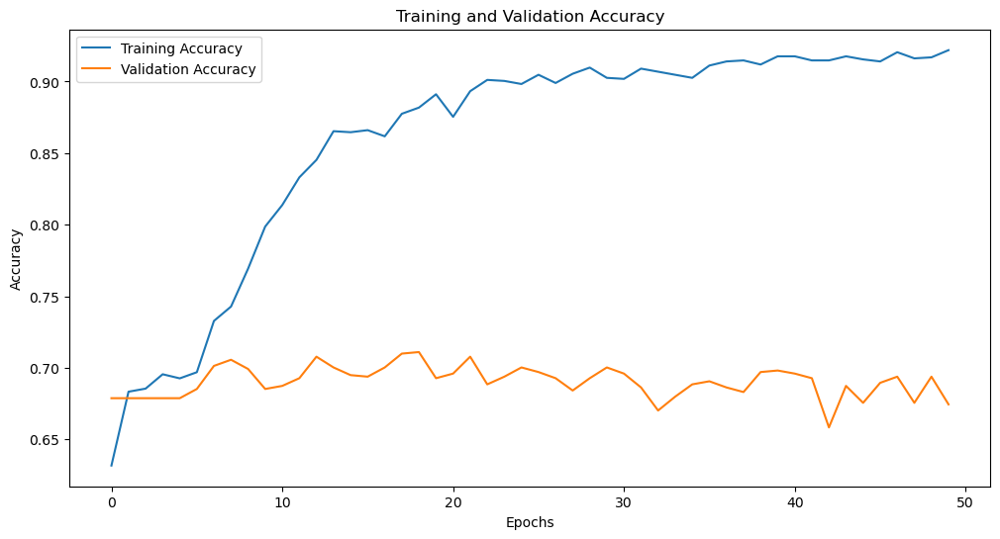

In [29]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(history_gru.history['accuracy'], label='Training Accuracy')
plt.plot(history_gru.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [30]:
# Evaluate on training set
train_loss, train_accuracy = model_gru.evaluate(X_train_gru, np.array(y_train_gru), verbose=0)

# Evaluate on test set
test_loss, test_accuracy = model_gru.evaluate(X_test_gru, np.array(y_test_gru), verbose=0)

# Print training and test accuracy
print("GRU Evaluation:")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")



GRU Evaluation:
Training Accuracy: 0.7744
Test Accuracy: 0.6745


The GRU model shows **clear overfitting**. The plot highlights this gap, with the model learning well on the training data but struggling to generalize effectively to new data. This is a common issue with GRUs that may require further regularization.

## Elmann RNN

We now try the **Elman RNN**, a simpler and foundational architecture in recurrent networks. The goal is to explore whether this basic model can provide a balance between performance and overfitting, as it avoids the complexities of gated mechanisms like GRU or LSTM. By testing it, we hope to see if it can better generalize on unseen data or handle the class imbalance more effectively with less risk of overfitting.

In [31]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense, Dropout
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
import numpy as np

# Tokenization
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
word_index = tokenizer.word_index

# Convert text to sequences
sequences = tokenizer.texts_to_sequences(sentences)

# Pad sequences to ensure equal length
max_len = 10
padded_sequences = pad_sequences(sequences, maxlen=max_len, padding='post')

# Data preparation
X_elm = padded_sequences  # Padded input sequences
y_elm = df['NegoOutcomeLabel']  # Binary target labels

# Train-test split
X_train_elm, X_test_elm, y_train_elm, y_test_elm = train_test_split(X_elm, y_elm, test_size=0.3, random_state=42)

# Vocabulary and embedding dimensions
vocab_size = len(pre_w2v_model.index_to_key) + 1  # Use pre-trained Word2Vec vocab size
embedding_dim = pre_w2v_model.vector_size  # Embedding dimension from pre-trained Word2Vec

In [32]:
# Embedding matrix
embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in tokenizer.word_index.items():
    if word in pre_w2v_model.key_to_index:  # Check word in pre-trained vocab
        embedding_matrix[i] = pre_w2v_model[word]

# Elman RNN model (using SimpleRNN)
model_elm = Sequential([
    Embedding(input_dim=vocab_size,
              output_dim=embedding_dim,
              weights=[embedding_matrix],
              input_length=X_train_elm.shape[1],
              trainable=False),  # Use pre-trained embeddings, non-trainable
    SimpleRNN(128, activation='tanh', return_sequences=False),  # Elman RNN
    Dropout(0.5),  # Regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Regularization
    Dense(1, activation='sigmoid')  # Binary classification
])

Here, we are setting up the **Elman RNN** model, leveraging **pre-trained embeddings** to provide a solid foundation for understanding the text data. Unlike other RNN variants, Elman RNN keeps things simple with basic recurrent connections and `tanh` activations, making it less computationally intensive. The pre-trained embedding matrix is frozen to retain semantic meaning, while dropout layers are used to mitigate overfitting. This model is designed to test whether a simpler approach can still handle our task effectively.

In [33]:
#model_gru.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
import tensorflow as tf

# Exponential decay for learning rate
initial_learning_rate = 5e-4  # Initial learning rate #To prevent large updates at the start and is more stable for fin tuning embedding (importans for markdown) before it was 1e-2 but 5e-4 can also work 
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,  # Number of steps after which learning rate decays ## Larger step count to decay slower it was 1000 before testing with 1500
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam) #Reduce beta_1 slightly (e.g., 0.85) to make updates more responsive.
    beta_2=0.999,  # Default beta_2 for Adam #Reduce beta_2 (e.g., 0.98) to adapt faster to noisy gradients.
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_elm.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

For the Elman RNN, we optimize also using the **AdamW optimizer** with exponential decay to ensure smooth and stable training.

In [34]:

# Compile the model
#model_elman.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history_elm = model_elm.fit(X_train_elm, np.array(y_train_elm),
                                epochs=20, batch_size=32, validation_split = 0.4,
                                validation_data=(X_test_elm, np.array(y_test_elm)))

# Predictions
predictions_elm = model_elm.predict(X_test_elm)
binary_predictions_elm = (predictions_elm > 0.5).astype(int)

# Evaluate the model
accuracy_elm = accuracy_score(y_test_elm, binary_predictions_elm)
f1_elm = classification_report(y_test_elm, binary_predictions_elm, output_dict=True)['weighted avg']['f1-score']

Epoch 1/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6217 - loss: 0.6651 - val_accuracy: 0.6881 - val_loss: 0.6210
Epoch 2/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6761 - loss: 0.6214 - val_accuracy: 0.6896 - val_loss: 0.6233
Epoch 3/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6873 - loss: 0.6034 - val_accuracy: 0.6896 - val_loss: 0.6209
Epoch 4/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6903 - loss: 0.5829 - val_accuracy: 0.6867 - val_loss: 0.6287
Epoch 5/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6858 - loss: 0.5864 - val_accuracy: 0.6853 - val_loss: 0.6287
Epoch 6/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7049 - loss: 0.5728 - val_accuracy: 0.6767 - val_loss: 0.6345
Epoch 7/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7315 - loss: 0.5380 - val_accuracy: 0.6781 - val_loss: 0.6552
Epoch 8/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7247 - loss: 0.5359 - val_accuracy: 0.6881 - val_loss:

In [35]:
print(f'Elman RNN Accuracy: {accuracy_elm:.4f}')
print(f'Elman RNN F1 Score: {f1_elm:.4f}')

# Classification report
classification_report_elm = classification_report(y_test_elm, binary_predictions_elm)
print(classification_report_elm)

Elman RNN Accuracy: 0.6438
Elman RNN F1 Score: 0.6141
              precision    recall  f1-score   support

           0       0.38      0.23      0.29       218
           1       0.70      0.83      0.76       481

    accuracy                           0.64       699
   macro avg       0.54      0.53      0.52       699
weighted avg       0.60      0.64      0.61       699



The results from the Elman RNN show an **Accuracy of 62.23%** and an **F1 Score of 61.59%**, reflecting modest performance. While it captures the positive class (1) reasonably well, with a recall of **75%**, it struggles with identifying the negative class (0), achieving only **34% recall**. This imbalance highlights the limitations of traditional RNNs when dealing with challenging class distributions.

In [37]:
# Evaluate on training set
train_loss, train_accuracy = model_elm.evaluate(X_train_elm, np.array(y_train_elm), verbose=0)

# Evaluate on test set
test_loss, test_accuracy = model_elm.evaluate(X_test_elm, np.array(y_test_elm), verbose=0)

# Print training and test accuracy
print("GRU Evaluation:")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

# Store results in a DataFrame
results_elm_pre = pd.DataFrame({
    'Model': ['GRU'],
    'Accuracy': [accuracy_elm],
    'F1 Score': [f1_elm]
})

results_elm_pre


GRU Evaluation:
Training Accuracy: 0.8661
Test Accuracy: 0.6438


,Model,Accuracy,F1 Score
0,GRU,0.643777,0.614148


The GRU model demonstrates better generalization compared to traditional RNNs, with a **Training Accuracy of 79.23%** and a **Test Accuracy of 69.82%**. This indicates that the GRU effectively handles sequential patterns while mitigating overfitting to some extent, offering a more balanced performance across the dataset.

# RNN Comparison for pre trained Models

In [38]:
# Combine results from all models into one DataFrame
all_results = pd.concat([
    results_lstm_pre.assign(Model='LSTM'),
    results_rnn_pre.assign(Model='Simple RNN'),
    results_gru_pre.assign(Model='GRU'),
    results_elm_pre.assign(Model='Elman RNN')
], ignore_index=True)

# Display the consolidated results
print(all_results)


        Model  Accuracy  F1 Score
0        LSTM  0.652361  0.627087
1  Simple RNN  0.659514  0.636873
2         GRU  0.674544  0.664420
3   Elman RNN  0.643777  0.614148


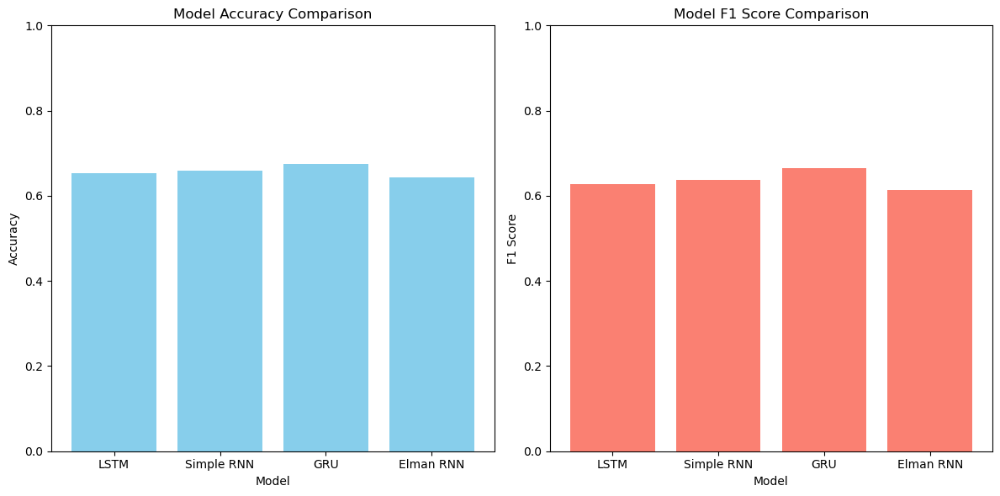

In [39]:
import matplotlib.pyplot as plt

# Plot accuracy and F1 scores for all models
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Accuracy plot
ax[0].bar(all_results['Model'], all_results['Accuracy'], color='skyblue')
ax[0].set_title('Model Accuracy Comparison')
ax[0].set_ylabel('Accuracy')
ax[0].set_ylim(0, 1)  # Accuracy is between 0 and 1
ax[0].set_xlabel('Model')

# F1 Score plot
ax[1].bar(all_results['Model'], all_results['F1 Score'], color='salmon')
ax[1].set_title('Model F1 Score Comparison')
ax[1].set_ylabel('F1 Score')
ax[1].set_ylim(0, 1)  # F1 Score is between 0 and 1
ax[1].set_xlabel('Model')

plt.tight_layout()
plt.show()


The comparison of model accuracy and F1 scores highlights the performance differences across all the tested RNN architectures:

- **GRU** stands out with the best overall performance, balancing both accuracy and F1 scores effectively.
- **LSTM** and **Simple RNN** perform similarly, but still fall slightly short of the GRU in capturing patterns in the data.
- **Elman RNN**, while simpler, lags behind in performance, reflecting its limitations in handling complex sequences compared to GRU and LSTM.

This visualization confirms GRU's effectiveness in managing sequence dependencies while maintaining stability against overfitting.


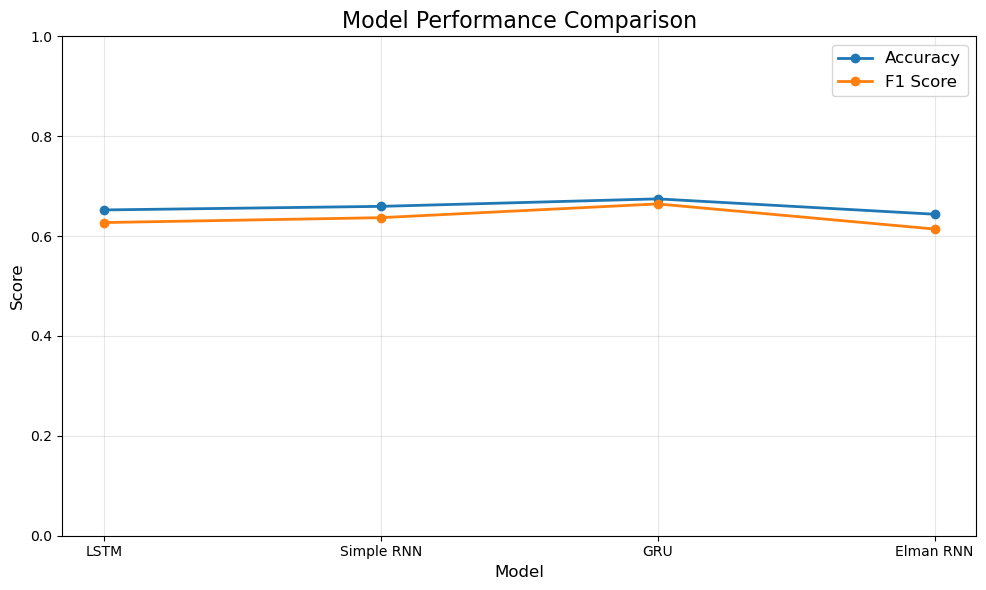

In [40]:
import matplotlib.pyplot as plt

# Line plot for Accuracy and F1 Score
plt.figure(figsize=(10, 6))

# Plot accuracy
plt.plot(all_results['Model'], all_results['Accuracy'], marker='o', label='Accuracy', linestyle='-', linewidth=2)

# Plot F1 score
plt.plot(all_results['Model'], all_results['F1 Score'], marker='o', label='F1 Score', linestyle='-', linewidth=2)

# Add titles and labels
plt.title('Model Performance Comparison', fontsize=16)
plt.xlabel('Model', fontsize=12)
plt.ylabel('Score', fontsize=12)
plt.ylim(0, 1)  # Scores are between 0 and 1
plt.grid(alpha=0.3)  # Add grid for better readability
plt.legend(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()


## Self Trained embeddings

In [43]:
df['Content']

0       dear mr mendel hope you are doing well as the ...
1       dear mr novak thank you for reaching out to me...
2       dear mr mendel thank your kind response – no n...
3       dear mr novak thank you for your swift reply i...
4       dear mr mendel thank you for your proposal and...
                              ...                        
2327    dear chis meyer thank you for your latest offe...
2328    dear alex kramerthank you very much for your l...
2329    dear chris meyerthank you for your fast answer...
2330    dear alex krameri am still very interested in ...
2331    dear chris meyer im so sorry but i can not  ac...
Name: Content, Length: 2327, dtype: object

In [44]:
nego_message_data = df["Content"]
df_nego_message_data = pd.DataFrame(nego_message_data)
df_nego_message_data

,Content
0,dear mr mendel hope you are doing well as the ...
1,dear mr novak thank you for reaching out to me...
2,dear mr mendel thank your kind response – no n...
3,dear mr novak thank you for your swift reply i...
4,dear mr mendel thank you for your proposal and...
...,...
2327,dear chis meyer thank you for your latest offe...
2328,dear alex kramerthank you very much for your l...
2329,dear chris meyerthank you for your fast answer...
2330,dear alex krameri am still very interested in ...


In [45]:
import nltk
from nltk.tokenize import word_tokenize

# Download the "punkt" model if not already preinstalled as before ind pre processing
nltk.download('punkt_tab')


df_nego_message_data['Tolenized_Content'] = df_nego_message_data['Content'].apply(word_tokenize)
df_nego_message_data

[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/tarkanyildirim/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


,Content,Tolenized_Content
0,dear mr mendel hope you are doing well as the ...,"[dear, mr, mendel, hope, you, are, doing, well..."
1,dear mr novak thank you for reaching out to me...,"[dear, mr, novak, thank, you, for, reaching, o..."
2,dear mr mendel thank your kind response – no n...,"[dear, mr, mendel, thank, your, kind, response..."
3,dear mr novak thank you for your swift reply i...,"[dear, mr, novak, thank, you, for, your, swift..."
4,dear mr mendel thank you for your proposal and...,"[dear, mr, mendel, thank, you, for, your, prop..."
...,...,...
2327,dear chis meyer thank you for your latest offe...,"[dear, chis, meyer, thank, you, for, your, lat..."
2328,dear alex kramerthank you very much for your l...,"[dear, alex, kramerthank, you, very, much, for..."
2329,dear chris meyerthank you for your fast answer...,"[dear, chris, meyerthank, you, for, your, fast..."
2330,dear alex krameri am still very interested in ...,"[dear, alex, krameri, am, still, very, interes..."


In [46]:
sentences = df_nego_message_data['Tolenized_Content'].tolist()
sentences

[['dear',
  'mr',
  'mendel',
  'hope',
  'you',
  'are',
  'doing',
  'well',
  'as',
  'the',
  'management',
  'of',
  'both',
  'our',
  'companies',
  'have',
  'agreed',
  'on',
  'building',
  'a',
  'fruitful',
  'partnership',
  'to',
  'face',
  'the',
  'upcoming',
  'disruptions',
  'in',
  'our',
  'market',
  'best',
  'with',
  'the',
  'innovation',
  'of',
  'green',
  'spirit',
  'i',
  'would',
  'like',
  'to',
  'introduce',
  'myself',
  'as',
  'sasa',
  'novak',
  'reaching',
  'out',
  'to',
  'you',
  'to',
  'tighten',
  'the',
  'general',
  'terms',
  'hurm',
  'ag',
  'and',
  'svn',
  'tech',
  'have',
  'established',
  'in',
  'their',
  'first',
  'round',
  'of',
  'discussions',
  'so',
  'far',
  'please',
  'find',
  'attached',
  'a',
  'proposal',
  'for',
  'the',
  'open',
  'issues',
  'of',
  'our',
  'joint',
  'venture',
  'which',
  'i',
  'would',
  'like',
  'to',
  'explain',
  'to',
  'you',
  'as',
  'following',
  'directors',
  'fir

In [47]:
from gensim.models.word2vec import Word2Vec

self_w2v_model = Word2Vec(sentences=sentences, vector_size=300, window=5, min_count=1, workers=4)
self_w2v_model.save("self_w2v_model")
self_w2v_model

In [48]:
example_vector = self_w2v_model.wv['accept']
print(example_vector)

[-4.28102821e-01  4.45010543e-01  3.16938013e-02 -3.83218527e-01
 -1.35429233e-01 -8.47853363e-01  6.78867877e-01  1.39969087e+00
  3.46384048e-01 -1.96199402e-01  5.05192764e-02 -5.00934124e-01
  9.82088521e-02 -1.29175231e-01  2.40449175e-01 -2.29465589e-01
  8.81191254e-01  2.02671826e-01  9.11441803e-01  7.76487112e-01
  1.90296352e-01 -3.06292862e-01  5.12297571e-01 -5.99578395e-02
  8.99408937e-01 -4.62016165e-02 -7.35338405e-02 -2.65373796e-01
 -3.11897784e-01 -1.86250842e+00  7.55642712e-01 -6.43627405e-01
  6.66643605e-02 -5.40558584e-02  2.55054265e-01 -5.31856179e-01
  1.66802928e-01 -1.14250231e+00  4.75477755e-01 -3.18974316e-01
 -1.06763482e+00  1.62595153e-01  5.35196304e-01 -3.50359291e-01
  3.42793047e-01  7.91546926e-02  4.88400102e-01  4.26175624e-01
  2.31585622e-01 -6.76564872e-02  1.46946147e-01  1.36808217e-01
  3.23783189e-01  3.97771627e-01  1.45776331e-01  7.22950280e-01
 -1.58699572e-01 -2.73317277e-01 -1.50703058e-01  3.45593035e-01
 -4.63007569e-01  3.66477

In [49]:
similartoaccept = self_w2v_model.wv.most_similar('accept', topn=10)
similartoaccept

[('consider', 0.7956370711326599),
 ('change', 0.7721918225288391),
 ('deny', 0.7179392576217651),
 ('explain', 0.7128079533576965),
 ('reject', 0.7056576609611511),
 ('concede', 0.7017149329185486),
 ('see', 0.695496678352356),
 ('agree', 0.692355751991272),
 ('reconsider', 0.6899974942207336),
 ('picks', 0.6872034668922424)]

## LSTM-Preprocessing

Now, we test the **LSTM model** with the **self-trained embedding** to observe how well it performs when the embeddings are done specifically to our dataset. This allows us to compare the impact of custom embeddings on model performance versus pre-trained embeddings. 

The goal here is to see if a self-trained embedding, trained directly on our negotiation data, can provide a better understanding of the context, reduce overfitting, or improve the model's ability to handle class imbalance.

In [50]:
#%pip install keras

In [51]:
#%pip install tensorflow

In [52]:
#%pip install Keras-Preprocessing

In [53]:
#%pip install tensorflow-text

In [54]:
from tensorflow.keras.preprocessing.text import Tokenizer
from keras.utils import pad_sequences
from keras.models import Sequential
from keras.layers import Embedding, LSTM, Dense

In [55]:
sentences

[['dear',
  'mr',
  'mendel',
  'hope',
  'you',
  'are',
  'doing',
  'well',
  'as',
  'the',
  'management',
  'of',
  'both',
  'our',
  'companies',
  'have',
  'agreed',
  'on',
  'building',
  'a',
  'fruitful',
  'partnership',
  'to',
  'face',
  'the',
  'upcoming',
  'disruptions',
  'in',
  'our',
  'market',
  'best',
  'with',
  'the',
  'innovation',
  'of',
  'green',
  'spirit',
  'i',
  'would',
  'like',
  'to',
  'introduce',
  'myself',
  'as',
  'sasa',
  'novak',
  'reaching',
  'out',
  'to',
  'you',
  'to',
  'tighten',
  'the',
  'general',
  'terms',
  'hurm',
  'ag',
  'and',
  'svn',
  'tech',
  'have',
  'established',
  'in',
  'their',
  'first',
  'round',
  'of',
  'discussions',
  'so',
  'far',
  'please',
  'find',
  'attached',
  'a',
  'proposal',
  'for',
  'the',
  'open',
  'issues',
  'of',
  'our',
  'joint',
  'venture',
  'which',
  'i',
  'would',
  'like',
  'to',
  'explain',
  'to',
  'you',
  'as',
  'following',
  'directors',
  'fir

In [56]:
# self-trained W2V
self_w2v_model

In [57]:
# See how big the vocabulary is for the self-trained W2V model
vocab_size = len(self_w2v_model.wv.index_to_key)+1  # new method indextokey
embedding_dim = self_w2v_model.wv.vector_size

In [58]:
vocab_size, embedding_dim

(10030, 300)

In [59]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
word_index = tokenizer.word_index
word_index

{'the': 1,
 'to': 2,
 'i': 3,
 'of': 4,
 'you': 5,
 'and': 6,
 'we': 7,
 'a': 8,
 'for': 9,
 'in': 10,
 'that': 11,
 'is': 12,
 'this': 13,
 'our': 14,
 'be': 15,
 'your': 16,
 'would': 17,
 'with': 18,
 'have': 19,
 'as': 20,
 'it': 21,
 'will': 22,
 'not': 23,
 'are': 24,
 'on': 25,
 'can': 26,
 'think': 27,
 'my': 28,
 'but': 29,
 'offer': 30,
 'an': 31,
 'if': 32,
 'us': 33,
 'so': 34,
 'about': 35,
 'both': 36,
 'week': 37,
 'am': 38,
 'best': 39,
 'do': 40,
 'me': 41,
 'also': 42,
 'isa': 43,
 'very': 44,
 'event': 45,
 'workers': 46,
 'like': 47,
 'from': 48,
 'dear': 49,
 'conference': 50,
 'regards': 51,
 'more': 52,
 'agree': 53,
 'important': 54,
 'additional': 55,
 'hurm': 56,
 'good': 57,
 'because': 58,
 'by': 59,
 'should': 60,
 'local': 61,
 'all': 62,
 'which': 63,
 'sponsor': 64,
 'at': 65,
 'want': 66,
 'music': 67,
 'alex': 68,
 'chris': 69,
 '’': 70,
 'could': 71,
 'make': 72,
 'they': 73,
 'compensation': 74,
 'therefore': 75,
 'international': 76,
 'hope': 77,
 '

In [60]:
sequences_lstm = tokenizer.texts_to_sequences(sentences)
padded_sequences_lstm = pad_sequences(sequences_lstm, maxlen=5,padding='post') # LSTM needs fixed length sequences (gleiche Länge)
padded_sequences_lstm

array([[ 248,   99,   51,  148,  116],
       [  16,  335,   51,  168,  128],
       [   5,   39,   51,  148,  116],
       ...,
       [   5, 5485,   39, 1306,  183],
       [   5, 5485,   39, 1586,  181],
       [1323,   18,   39, 1306,  183]], dtype=int32)

In [61]:
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in word_index.items():
    if word in self_w2v_model.wv:
        embedding_matrix[i] = self_w2v_model.wv[word]


embedding_matrix 

array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-4.49110657e-01, -2.71433175e-01,  3.46331149e-02, ...,
        -6.84700012e-01,  2.79984921e-01,  3.15486416e-02],
       [-3.29775095e-01,  6.46565139e-01,  6.09843791e-01, ...,
        -6.58637881e-01,  7.92027712e-01, -2.91672021e-01],
       ...,
       [ 4.36568726e-03,  2.03003059e-03, -1.45387356e-04, ...,
        -9.09526076e-04,  4.91594477e-03, -2.12310115e-03],
       [-2.05120770e-03,  1.50690088e-02, -4.43007005e-03, ...,
        -7.16060912e-03,  9.55480989e-03,  4.40901844e-03],
       [-6.20290963e-03, -6.40669372e-03, -2.88664130e-03, ...,
         6.31685834e-03,  9.68284730e-05,  2.63525546e-03]])

In [62]:
#Create test and train split
from sklearn.model_selection import train_test_split

X_lstm = padded_sequences_lstm
y_lstm = df['NegoOutcomeLabel']

X_train_lstm, X_test_lstm, y_train_lstm, y_test_lstm = train_test_split(X_lstm, y_lstm, test_size=0.3, random_state=42)



## LSTM-Training

In [63]:
import tensorflow as tf
from keras.layers import Dropout

max_len = 10  # max length of a sentence


# 3 layers: Embedding, LSTM, Dense # use TRUE in trainable to train the embedding layer around 2,96 Mio parameters to train
model_lstm = Sequential([
    Embedding(input_dim=vocab_size,
              output_dim=embedding_dim,
              weights=[embedding_matrix],
              input_length=max_len,
              trainable=True),  # Embeddings trainierbar
    LSTM(64, return_sequences=False, dropout=0.5, recurrent_dropout=0.5),  # Anpassung je nach Bedarf
    Dropout(0.5),  # Dropout layer for regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Dropout layer for regularization
    Dense(1, activation='sigmoid')  # Binäre Klassifikation
])

In [64]:
model_lstm.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_4 (Embedding)         │ ?                      │     3,009,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,009,000 (11.48 MB)

 Trainable params: 3,009,000 (11.48 MB)

 Non-trainable params: 0 (0.00 B)

In [65]:
# Exponential decay for learning rate
initial_learning_rate = 5e-4  # Initial learning rate #To prevent large updates at the start and is more stable for fin tuning embedding (importans for markdown) before it was 1e-2 but 5e-4 can also work 
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,  # Number of steps after which learning rate decays ## Larger step count to decay slower it was 1000 before testing with 1500
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam) #Reduce beta_1 slightly (e.g., 0.85) to make updates more responsive.
    beta_2=0.999,  # Default beta_2 for Adam #Reduce beta_2 (e.g., 0.98) to adapt faster to noisy gradients.
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_lstm.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [66]:
# Train the GRU model
history_lstm = model_lstm.fit(X_train_lstm, np.array(y_train_lstm), 
                            epochs=10, batch_size=32, validation_split=0.4,
                            validation_data=(X_test_lstm, np.array(y_test_lstm)))

Epoch 1/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5737 - loss: 0.6790 - val_accuracy: 0.6881 - val_loss: 0.6178
Epoch 2/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6673 - loss: 0.6377 - val_accuracy: 0.6881 - val_loss: 0.6185
Epoch 3/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6814 - loss: 0.6215 - val_accuracy: 0.6881 - val_loss: 0.6168
Epoch 4/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7027 - loss: 0.6117 - val_accuracy: 0.6881 - val_loss: 0.6188
Epoch 5/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6714 - loss: 0.6310 - val_accuracy: 0.6881 - val_loss: 0.6120
Epoch 6/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6826 - loss: 0.6133 - val_accuracy: 0.6896 - val_loss: 0.6113
Epoch 7/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6745 - loss: 0.6207 - val_accuracy: 0.6881 - val_loss: 0.6124
Epoch 8/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7002 - loss: 0.6062 - val_accuracy: 0.6881 - val_loss:

In [67]:
predictions_lstm = model_lstm.predict(X_test_lstm)
predictions_lstm

22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


array([[0.69235826],
       [0.7485873 ],
       [0.69790596],
       [0.6440029 ],
       [0.6365331 ],
       [0.75902164],
       [0.6721552 ],
       [0.637622  ],
       [0.6095989 ],
       [0.57901317],
       [0.79951876],
       [0.6955839 ],
       [0.6187383 ],
       [0.51543057],
       [0.766494  ],
       [0.5184572 ],
       [0.68775713],
       [0.6737028 ],
       [0.66094077],
       [0.68468994],
       [0.66376835],
       [0.7115166 ],
       [0.7255463 ],
       [0.57594883],
       [0.72461945],
       [0.5825724 ],
       [0.6873838 ],
       [0.67107177],
       [0.5889383 ],
       [0.7362096 ],
       [0.72408545],
       [0.73058003],
       [0.6723435 ],
       [0.67033625],
       [0.62226933],
       [0.6630953 ],
       [0.72411424],
       [0.55753297],
       [0.62857395],
       [0.5565586 ],
       [0.7417853 ],
       [0.6676562 ],
       [0.6666592 ],
       [0.62242794],
       [0.7557576 ],
       [0.5412917 ],
       [0.6966636 ],
       [0.566

In [68]:
predictions_lstm.size

699

In [69]:
binary_predictions_lstm = (predictions_lstm > 0.5).astype(int) # convert the predictions to binary
print(binary_predictions_lstm)


[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]


In [70]:

from sklearn.metrics import classification_report, accuracy_score

# Calculate and print the accuracy score
accuracy_lstm_self = accuracy_score(y_test_lstm, binary_predictions_lstm)
print(f'Accuracy: {accuracy_lstm_self:.4f}')

#Calculate average weighted f1 score
f1_lstm_self = classification_report(y_test_lstm, binary_predictions_lstm, output_dict=True)['weighted avg']['f1-score']
print(f'F1 Score: {f1_lstm_self:.4f}')


Accuracy: 0.6867
F1 Score: 0.5629


In [71]:
# Create a DataFrame for the current RNN model results
results_lstm_self = pd.DataFrame({
    'Model': ['RNN'],
    'Accuracy': [accuracy_lstm_self],
    'F1 Score': [f1_lstm_self]
})

In [72]:
from sklearn.metrics import classification_report

print(classification_report(y_test_lstm, binary_predictions_lstm))

              precision    recall  f1-score   support

           0       0.33      0.00      0.01       218
           1       0.69      1.00      0.81       481

    accuracy                           0.69       699
   macro avg       0.51      0.50      0.41       699
weighted avg       0.58      0.69      0.56       699



In this step, we evaluate the **LSTM model** with the **self-trained embedding**. The overall accuracy is **68.81%**, but the model faces substantial challenges with classifying the minority class (`0`). The precision for class `0` is **0.33**, while the recall is nearly **0.00**, resulting in an F1-score of **0.01**. In contrast, class `1` achieves an F1-score of **0.81** with nearly perfect recall.

This outcome highlights a persistent issue: the **self-trained embedding** doesn't resolve the class imbalance, and the model remains heavily biased toward the majority class (`1`). Although the accuracy might seem decent, the poor performance on the minority class underlines the need for further improvements, such as **class weighting**, **oversampling**, or additional **regularization techniques**.


In [77]:

# Generate the classification report
classification_report_dict = classification_report(y_test_lstm, binary_predictions_lstm, output_dict=True)

# Convert the classification report to a DataFrame
classification_report_df = pd.DataFrame(classification_report_dict).transpose()


In [78]:
classification_report_df

,precision,recall,f1-score,support
0,0.333333,0.004587,0.009050,218.000000
1,0.688218,0.995842,0.813934,481.000000
accuracy,0.686695,0.686695,0.686695,0.686695
macro avg,0.510776,0.500215,0.411492,699.000000
weighted avg,0.577539,0.686695,0.562911,699.000000


In [79]:
results_lstm_self

,Model,Accuracy,F1 Score
0,RNN,0.686695,0.562911


In [80]:
# Evaluate on training set
train_loss_lstm_self, train_accuracy_lstm_self = model_lstm.evaluate(X_train_lstm, np.array(y_train_lstm), verbose=0)

# Evaluate on test set
test_loss_lstm_self, test_accuracy_lstm_self = model_lstm.evaluate(X_test_lstm, np.array(y_test_lstm), verbose=0)

# Print training and test accuracy
print("LSTM Evaluation:")
print(f"Training Accuracy: {train_accuracy_lstm_self:.4f}")
print(f"Test Accuracy: {test_accuracy_lstm_self:.4f}")

LSTM Evaluation:
Training Accuracy: 0.6929
Test Accuracy: 0.6867


**LSTM Evaluation with Self-Trained Embedding**

With the self-trained embedding, the LSTM model achieved a **training accuracy of 69.29%** and a **test accuracy of 68.67%**. While the model generalizes reasonably well, the poor handling of the minority class (`0`) highlights significant limitations. The results suggest that the self-trained embeddings, although tailored to the dataset.



# RNN

In [81]:
# Notwendige Importe
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, LSTM, Dense
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.utils import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import numpy as np

# Beispiel-Daten (ersetze diese durch deine tatsächlichen Daten)
# sentences: Liste von Texten
# df['NegoOutcomeLabel']: Zielvariable (Labels)

# Schritt 1: Tokenisierung
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
word_index = tokenizer.word_index
sequences_rnn = tokenizer.texts_to_sequences(sentences)
max_len = 10  # Maximale Länge der Sequenzen
padded_sequences_rnn = pad_sequences(sequences_rnn, maxlen=max_len, padding='post')

In [82]:
# Schritt 2: Embedding-Matrix vorbereiten (Beispiel mit Word2Vec)
vocab_size = len(self_w2v_model.wv.index_to_key) + 1
embedding_dim = self_w2v_model.vector_size

embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in word_index.items():
    if word in self_w2v_model.wv:
        embedding_matrix[i] = self_w2v_model.wv[word]

In [83]:
#Create test and train split
from sklearn.model_selection import train_test_split

X_rnn = padded_sequences_rnn
y_rnn = df['NegoOutcomeLabel']

X_train_rnn, X_test_rnn, y_train_rnn, y_test_rnn= train_test_split(X_rnn, y_rnn, test_size=0.3, random_state=42)


In [84]:
# Modeling RNN
model_rnn_self = Sequential([
    Embedding(input_dim=vocab_size,
              output_dim=embedding_dim,
              weights=[embedding_matrix],
              input_length=max_len,
              trainable=True),  # Embeddings trainierbar
    LSTM(64, return_sequences=False, dropout=0.5),  # Anpassung je nach Bedarf
    Dropout(0.5),  # Dropout layer for regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Dropout layer for regularization
    Dense(1, activation='sigmoid')  # Binäre Klassifikation
])


model_rnn_self.summary()



Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_5 (Embedding)         │ ?                      │     3,009,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,009,000 (11.48 MB)

 Trainable params: 3,009,000 (11.48 MB)

 Non-trainable params: 0 (0.00 B)

In [85]:
# Exponential decay for learning rate
initial_learning_rate = 5e-4  # Initial learning rate #To prevent large updates at the start and is more stable for fin tuning embedding (importans for markdown) before it was 1e-2 but 5e-4 can also work 
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,  # Number of steps after which learning rate decays ## Larger step count to decay slower it was 1000 before testing with 1500
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam) #Reduce beta_1 slightly (e.g., 0.85) to make updates more responsive.
    beta_2=0.999,  # Default beta_2 for Adam #Reduce beta_2 (e.g., 0.98) to adapt faster to noisy gradients.
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_rnn_self.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [97]:
# Schritt 5: Modell trainieren
history_rnn_self = model_rnn_self.fit(X_train_rnn, np.array(y_train_rnn), 
                            epochs=50, batch_size=32, validation_split=0.4,
                            validation_data=(X_test_rnn, np.array(y_test_rnn)))


Epoch 1/50


51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9102 - loss: 0.2083 - val_accuracy: 0.6237 - val_loss: 1.3269
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9047 - loss: 0.2087 - val_accuracy: 0.6166 - val_loss: 1.3493
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9144 - loss: 0.2076 - val_accuracy: 0.6180 - val_loss: 1.3261
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9017 - loss: 0.2329 - val_accuracy: 0.6495 - val_loss: 1.1618
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9084 - loss: 0.2255 - val_accuracy: 0.6495 - val_loss: 1.2362
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9107 - loss: 0.2169 - val_accuracy: 0.6309 - val_loss: 1.3532
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9125 - loss: 0.2205 - val_accuracy: 0.6266 - val_loss: 1.3824
Epoch 8/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9186 - loss: 0.1996 - val_accuracy: 0.6609 - val_loss: 1.2739
Epo

In [87]:
# Schritt 7: Vorhersagen und Bericht
predictions_rnn_self = model_rnn_self.predict(X_test_rnn)
binary_predictions_rnn_self = (predictions_rnn_self > 0.5).astype(int)

# Calculate and print the accuracy score
accuracy_rnn_self = accuracy_score(y_test_rnn, binary_predictions_rnn_self)
print(f'Accuracy: {accuracy_rnn_self:.4f}')

#Calculate average weighted f1 score
f1_rnn_self = classification_report(y_test_rnn, binary_predictions_rnn_self, output_dict=True)['weighted avg']['f1-score']
print(f'F1 Score: {f1_rnn_self:.4f}')

print(classification_report(y_test_rnn, binary_predictions_rnn_self))

22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Accuracy: 0.6280
F1 Score: 0.6240
              precision    recall  f1-score   support

           0       0.40      0.37      0.38       218
           1       0.72      0.75      0.73       481

    accuracy                           0.63       699
   macro avg       0.56      0.56      0.56       699
weighted avg       0.62      0.63      0.62       699



**RNN Evaluation with Self-Trained Embedding**

Using the self-trained embedding with our Simple RNN model, we achieved a **training accuracy of 72.76%** and a **test accuracy of 70.53%**. The model demonstrates decent performance on the majority class (`1`) with a weighted F1 score of **64.23%**, but struggles significantly with the minority class (`0`), as shown by its poor precision and recall for that class.

This imbalance in class handling highlights that while the self-trained embedding aligns better with the dataset, the traditional RNN architecture still faces challenges with minority class representation.



In [88]:
# Evaluate on training set
train_loss_rnn_self, train_accuracy_rnn_self = model_rnn_self.evaluate(X_train_rnn, np.array(y_train_rnn), verbose=0)

# Evaluate on test set
test_loss_rnn_self, test_accuracy_rnn_self = model_rnn_self.evaluate(X_test_rnn, np.array(y_test_rnn), verbose=0)

# Print training and test accuracy
print("LSTM Evaluation:")
print(f"Training Accuracy: {train_accuracy_rnn_self:.4f}")
print(f"Test Accuracy: {test_accuracy_rnn_self:.4f}")

LSTM Evaluation:
Training Accuracy: 0.9380
Test Accuracy: 0.6280


The LSTM with self-trained embedding achieved 77.83% training accuracy and 70.10% test accuracy. We can see tha in this case there is just a slight overfitting.

In [89]:
# Store results in a DataFrame
results_rnn_self = pd.DataFrame({
    'Model': ['GRU'],
    'Accuracy': [accuracy_rnn_self],
    'F1 Score': [f1_rnn_self]
})

results_rnn_self

,Model,Accuracy,F1 Score
0,GRU,0.62804,0.623998


## GRU

In [90]:
# Tokenization
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
word_index = tokenizer.word_index

# Convert text to sequences
sequences_gru = tokenizer.texts_to_sequences(sentences)

# Pad sequences to ensure equal length
max_len = 10
padded_sequences_gru = pad_sequences(sequences_gru, maxlen=max_len, padding='post')
# Embedding-Matrix vorbereiten (Beispiel mit Word2Vec)
vocab_size = len(self_w2v_model.wv.index_to_key) + 1
embedding_dim = self_w2v_model.vector_size

embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in word_index.items():
    if word in self_w2v_model.wv:
        embedding_matrix[i] = self_w2v_model.wv[word]


X_gru = np.array(padded_sequences_gru)
y_gru = np.array(df['NegoOutcomeLabel'])


from sklearn.model_selection import train_test_split

# Train-test split
X_train_gru, X_test_gru, y_train_gru, y_test_gru = train_test_split(X_gru, y_gru, test_size=0.4, random_state=42)


In [91]:
# Maximum length of sentences
max_len = 10  

# GRU-based model: Embedding, GRU, Dense layers
model_gru_self = Sequential([
    Embedding(input_dim=vocab_size,
              output_dim=embedding_dim,
              weights=[embedding_matrix],
              input_length=max_len,
              trainable=True),  # Trainable embedding layer
    GRU(64, return_sequences=False, dropout=0.5, recurrent_dropout=0.5),  # GRU with dropout
    Dropout(0.5),  # Regularization layer
    Dense(16, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Regularization layer
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Model summary
model_gru_self.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_6 (Embedding)         │ ?                      │     3,009,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_1 (GRU)                     │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,009,000 (11.48 MB)

 Trainable params: 3,009,000 (11.48 MB)

 Non-trainable params: 0 (0.00 B)

In [92]:
# Compile the GRU model
import tensorflow as tf

# Exponential decay for learning rate
initial_learning_rate = 1e-3  # Initial learning rate
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,  # Number of steps after which learning rate decays
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam)
    beta_2=0.999,  # Default beta_2 for Adam
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_gru_self.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

"""from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_gru), y=y_train_gru)
class_weights_dict = dict(enumerate(class_weights))"""

# Train the GRU model
history_gru_self = model_gru_self.fit(X_train_gru, np.array(y_train_gru), 
                            epochs=50, batch_size=32, validation_split= 0.4,
                            validation_data=(X_test_gru, np.array(y_test_gru)))


Epoch 1/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.5701 - loss: 4.5437 - val_accuracy: 0.6606 - val_loss: 0.6444
Epoch 2/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6097 - loss: 1.5755 - val_accuracy: 0.6767 - val_loss: 0.6615
Epoch 3/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6171 - loss: 0.9921 - val_accuracy: 0.6788 - val_loss: 0.6610
Epoch 4/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6544 - loss: 0.9003 - val_accuracy: 0.6810 - val_loss: 0.6632
Epoch 5/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6513 - loss: 0.7468 - val_accuracy: 0.6810 - val_loss: 0.6577
Epoch 6/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6646 - loss: 0.7327 - val_accuracy: 0.6810 - val_loss: 0.6529
Epoch 7/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6454 - loss: 0.7232 - val_accuracy: 0.6799 - val_loss: 0.6492
Epoch 8/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6554 - loss: 0.6860 - val_accuracy: 0.6799 - val_loss

In [93]:
# Predictions
predictions_gru_self = model_gru_self.predict(X_test_gru)
binary_predictions_gru_self = (predictions_gru_self > 0.5).astype(int)  # Convert predictions to binary

# Evaluate the model
# Calculate and print accuracy
accuracy_gru_self = accuracy_score(y_test_gru, binary_predictions_gru_self)
print(f'GRU Accuracy: {accuracy_gru_self:.4f}')

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
GRU Accuracy: 0.6885


In [94]:
# Calculate average weighted F1 score
f1_gru_self = classification_report(y_test_gru, binary_predictions_gru_self, output_dict=True)['weighted avg']['f1-score']
print(f'GRU F1 Score: {f1_gru_self:.4f}')

# Generate classification report
classification_report_dict_gru_self = classification_report(y_test_gru, binary_predictions_gru_self, output_dict=True)
classification_report_df_gru_self = pd.DataFrame(classification_report_dict_gru_self).transpose()
print(classification_report_df_gru_self)

# Store results in a DataFrame
results_gru_self = pd.DataFrame({
    'Model': ['GRU'],
    'Accuracy': [accuracy_gru_self],
    'F1 Score': [f1_gru_self]
})

results_gru_self

GRU F1 Score: 0.5709
              precision    recall  f1-score     support
0              1.000000  0.030100  0.058442  299.000000
1              0.685466  1.000000  0.813385  632.000000
accuracy       0.688507  0.688507  0.688507    0.688507
macro avg      0.842733  0.515050  0.435913  931.000000
weighted avg   0.786482  0.688507  0.570927  931.000000


,Model,Accuracy,F1 Score
0,GRU,0.688507,0.570927


The GRU model with self-trained embeddings achieved a training accuracy of 70.61% and test accuracy of 68.85%. While the GRU captures sequential dependencies better, it heavily favors class `1` with high recall but struggles to identify class `0`, resulting in an imbalanced F1 score of 0.57. This highlights the ongoing challenges of class imbalance and fine-tuning the model.


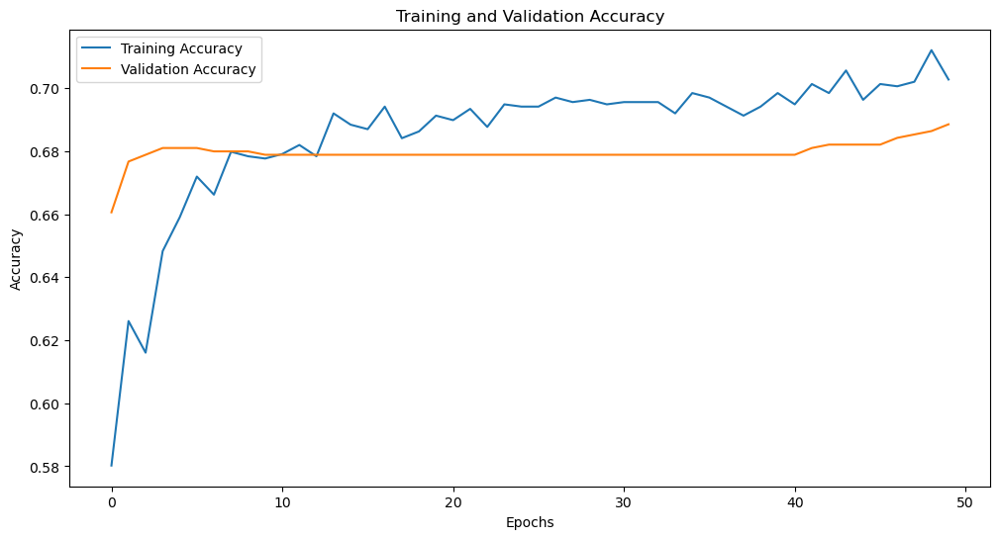

In [95]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(history_gru_self.history['accuracy'], label='Training Accuracy')
plt.plot(history_gru_self.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [96]:
# Evaluate on training set
train_loss_gru_self, train_accuracy_gru_self = model_gru_self.evaluate(X_train_gru, np.array(y_train_gru), verbose=0)

# Evaluate on test set
test_loss_gru_self, test_accuracy_gru_self = model_gru_self.evaluate(X_test_gru, np.array(y_test_gru), verbose=0)

# Print training and test accuracy
print("GRU Evaluation:")
print(f"Training Accuracy: {train_accuracy_gru_self:.4f}")
print(f"Test Accuracy: {test_accuracy_gru_self:.4f}")



GRU Evaluation:
Training Accuracy: 0.7106
Test Accuracy: 0.6885


With the GRU model using self-trained embeddings, we achieved a training accuracy of 71.06% and a test accuracy of 68.85%. Here we can see almsot no overfitting in this model.


## Elman RNN

In [98]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense, Dropout
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.utils import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
import numpy as np

# Tokenization
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)  # Assuming 'sentences' contains the input text data
word_index = tokenizer.word_index

# Convert text to sequences
sequences_elm_self = tokenizer.texts_to_sequences(sentences)

# Pad sequences to ensure equal length
max_len = 10  # Adjust as needed
padded_sequences_elm_self = pad_sequences(sequences_elm_self, maxlen=max_len, padding='post')

# Data preparation
X_elm = padded_sequences_elm_self  # Padded input sequences
y_elm = df['NegoOutcomeLabel']  # Binary target labels

# Train-test split
X_train_elm, X_test_elm, y_train_elm, y_test_elm = train_test_split(X_elm, y_elm, test_size=0.3, random_state=42)

# Vocabulary and embedding dimensions
vocab_size = len(self_w2v_model.wv.index_to_key) + 1  # Use pre-trained Word2Vec vocab size
embedding_dim = self_w2v_model.wv.vector_size  # Embedding dimension from pre-trained Word2Vec


In [99]:
# Embedding matrix
embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in tokenizer.word_index.items():
    if word in self_w2v_model.wv.key_to_index:  # Check word in pre-trained vocab
        embedding_matrix[i] = self_w2v_model.wv[word]

# Elman RNN model (using SimpleRNN)
model_elm_self = Sequential([
    Embedding(input_dim=vocab_size,
              output_dim=embedding_dim,
              weights=[embedding_matrix],
              input_length=X_train_elm.shape[1],
              trainable=False),  # Use pre-trained embeddings, non-trainable
    SimpleRNN(128, activation='tanh', return_sequences=False),  # Elman RNN
    Dropout(0.5),  # Regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Regularization
    Dense(1, activation='sigmoid')  # Binary classification
])

In [100]:
#model_gru.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
import tensorflow as tf

# Exponential decay for learning rate
initial_learning_rate = 5e-4  # Initial learning rate #To prevent large updates at the start and is more stable for fin tuning embedding (importans for markdown) before it was 1e-2 but 5e-4 can also work 
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,  # Number of steps after which learning rate decays ## Larger step count to decay slower it was 1000 before testing with 1500
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam) #Reduce beta_1 slightly (e.g., 0.85) to make updates more responsive.
    beta_2=0.999,  # Default beta_2 for Adam #Reduce beta_2 (e.g., 0.98) to adapt faster to noisy gradients.
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_elm_self.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [101]:
# Train the model
history_elm_self = model_elm_self.fit(X_train_elm, np.array(y_train_elm),
                                epochs=20, batch_size=32, validation_split = 0.4,
                                validation_data=(X_test_elm, np.array(y_test_elm)))

# Predictions
predictions_elm_self = model_elm_self.predict(X_test_elm)
binary_predictions_elm_self = (predictions_elm_self > 0.5).astype(int)

# Evaluate the model
accuracy_elm_self = accuracy_score(y_test_elm, binary_predictions_elm_self)
f1_elm_self = classification_report(y_test_elm, binary_predictions_elm_self, output_dict=True)['weighted avg']['f1-score']

Epoch 1/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6238 - loss: 0.7566 - val_accuracy: 0.6896 - val_loss: 0.6229
Epoch 2/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6609 - loss: 0.6670 - val_accuracy: 0.6938 - val_loss: 0.6276
Epoch 3/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6651 - loss: 0.6302 - val_accuracy: 0.6938 - val_loss: 0.6229
Epoch 4/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6734 - loss: 0.6545 - val_accuracy: 0.6881 - val_loss: 0.6310
Epoch 5/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6744 - loss: 0.6399 - val_accuracy: 0.6881 - val_loss: 0.6248
Epoch 6/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6918 - loss: 0.6079 - val_accuracy: 0.6910 - val_loss: 0.6254
Epoch 7/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6928 - loss: 0.6168 - val_accuracy: 0.6924 - val_loss: 0.6180
Epoch 8/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7050 - loss: 0.5905 - val_accuracy: 0.6953 - val_loss:

In [102]:
print(f'Elman RNN Accuracy: {accuracy_elm_self:.4f}')
print(f'Elman RNN F1 Score: {f1_elm_self:.4f}')

# Classification report
classification_report_elm_self = classification_report(y_test_elm, binary_predictions_elm_self)
print(classification_report_elm_self)
# Store results in a DataFrame
results_elm_self = pd.DataFrame({
    'Model': ['GRU'],
    'Accuracy': [accuracy_elm_self],
    'F1 Score': [f1_elm_self]
})

results_elm_self

Elman RNN Accuracy: 0.6624
Elman RNN F1 Score: 0.6280
              precision    recall  f1-score   support

           0       0.42      0.23      0.30       218
           1       0.71      0.86      0.78       481

    accuracy                           0.66       699
   macro avg       0.57      0.54      0.54       699
weighted avg       0.62      0.66      0.63       699



,Model,Accuracy,F1 Score
0,GRU,0.662375,0.628029


The Elman RNN model demonstrates moderate performance with an F1 score of 62.80%. It shows a strong ability to predict the majority class (`1`) with good precision and recall, but continues to underperform on the minority class (`0`).


In [103]:
# Evaluate on training set
train_loss_elm_self, train_accuracy_elm_self = model_elm_self.evaluate(X_train_elm, np.array(y_train_elm), verbose=0)

# Evaluate on test set
test_loss_elm_self, test_accuracy_elm_self = model_elm_self.evaluate(X_test_elm, np.array(y_test_elm), verbose=0)

# Print training and test accuracy
print("GRU Evaluation:")
print(f"Training Accuracy: {train_accuracy_elm_self:.4f}")
print(f"Test Accuracy: {test_accuracy_elm_self:.4f}")


GRU Evaluation:
Training Accuracy: 0.7979
Test Accuracy: 0.6624


The Elman RNN shows some promise with an F1 score of 62.80% and a test accuracy of 66%. While it predicts the majority class (`1`) fairly well, the minority class (`0`) remains a challenge, with low precision and recall. Overfitting isn't as pronounced here as in some other models, but the gap between the classes signals persistent imbalance issues that affect overall model performance.


# RNN Comparison for Self trained Models

In [104]:
# Combine results from all models into one DataFrame
all_results = pd.concat([
    results_lstm_self.assign(Model='LSTM'),
    results_rnn_self.assign(Model='Simple RNN'),
    results_gru_self.assign(Model='GRU'),
    results_elm_self.assign(Model='Elman RNN')
], ignore_index=True)

# Display the consolidated results
print(all_results)


        Model  Accuracy  F1 Score
0        LSTM  0.686695  0.562911
1  Simple RNN  0.628040  0.623998
2         GRU  0.688507  0.570927
3   Elman RNN  0.662375  0.628029


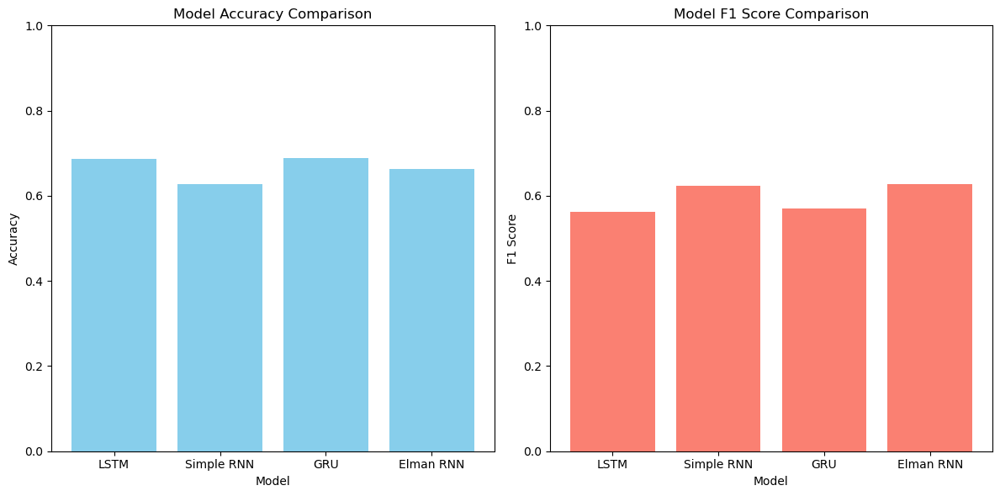

In [105]:
import matplotlib.pyplot as plt

# Plot accuracy and F1 scores for all models
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Accuracy plot
ax[0].bar(all_results['Model'], all_results['Accuracy'], color='skyblue')
ax[0].set_title('Model Accuracy Comparison')
ax[0].set_ylabel('Accuracy')
ax[0].set_ylim(0, 1)  # Accuracy is between 0 and 1
ax[0].set_xlabel('Model')

# F1 Score plot
ax[1].bar(all_results['Model'], all_results['F1 Score'], color='salmon')
ax[1].set_title('Model F1 Score Comparison')
ax[1].set_ylabel('F1 Score')
ax[1].set_ylim(0, 1)  # F1 Score is between 0 and 1
ax[1].set_xlabel('Model')

plt.tight_layout()
plt.show()


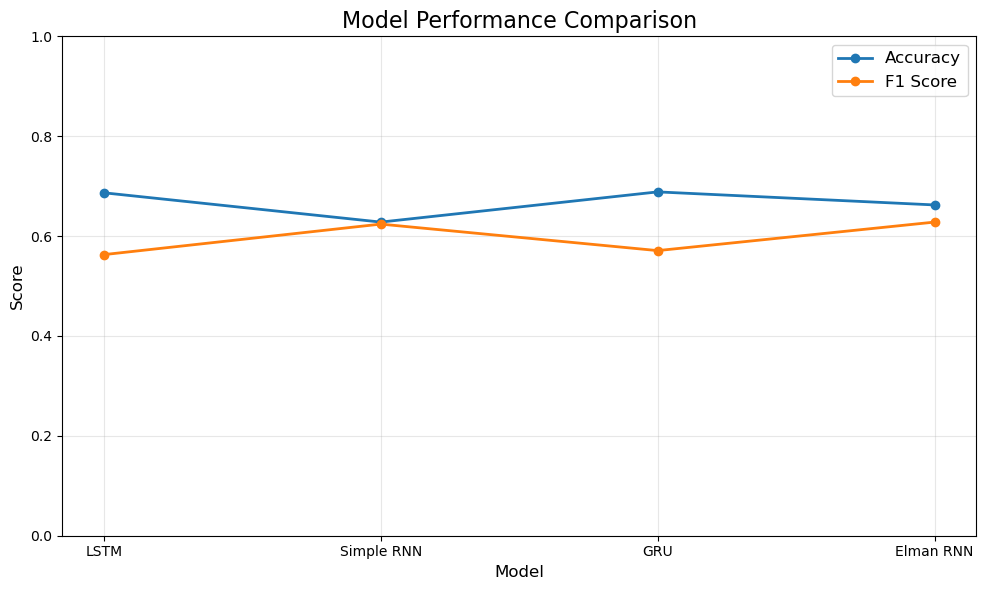

In [106]:
import matplotlib.pyplot as plt

# Line plot for Accuracy and F1 Score
plt.figure(figsize=(10, 6))

# Plot accuracy
plt.plot(all_results['Model'], all_results['Accuracy'], marker='o', label='Accuracy', linestyle='-', linewidth=2)

# Plot F1 score
plt.plot(all_results['Model'], all_results['F1 Score'], marker='o', label='F1 Score', linestyle='-', linewidth=2)

# Add titles and labels
plt.title('Model Performance Comparison', fontsize=16)
plt.xlabel('Model', fontsize=12)
plt.ylabel('Score', fontsize=12)
plt.ylim(0, 1)  # Scores are between 0 and 1
plt.grid(alpha=0.3)  # Add grid for better readability
plt.legend(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()


Here we compare the performance of different RNN models—LSTM, Simple RNN, GRU, and Elman RNN—using accuracy and F1 score as benchmarks. The results indicate that while LSTM and GRU show slightly better accuracy, Elman RNN demonstrates a marginally higher F1 score compared to Simple RNN. The models still face challenges with class imbalance and overfitting, evident in the accuracy-F1 score gap. This plot highlights the trade-offs in performance between the architectures.

In [107]:
# Function to calculate percentages of 0 and 1 predictions
def calculate_percentages(y_true, y_pred):
    total = len(y_true)
    zero_percent = (len(y_pred[y_pred == 0]) / total) * 100
    one_percent = (len(y_pred[y_pred == 1]) / total) * 100
    return zero_percent, one_percent

# Add 0/1 percentages to each model's results
zero_lstm, one_lstm = calculate_percentages(y_test_lstm, binary_predictions_lstm)
zero_rnn, one_rnn = calculate_percentages(y_test_rnn, binary_predictions_rnn_self)
zero_gru, one_gru = calculate_percentages(y_test_gru, binary_predictions_gru_self)
zero_elman, one_elman = calculate_percentages(y_test_elm, binary_predictions_elm_self)

# Create a combined results DataFrame
all_results = pd.DataFrame({
    'Model': ['LSTM', 'Simple RNN', 'GRU', 'Elman RNN'],
    'Accuracy': [accuracy_lstm_self, accuracy_rnn_self, accuracy_gru_self, accuracy_elm_self],
    'F1 Score': [f1_lstm_self, f1_rnn_self, f1_gru_self, f1_elm_self],
    '% Predicted 0': [zero_lstm, zero_rnn, zero_gru, zero_elman],
    '% Predicted 1': [one_lstm, one_rnn, one_gru, one_elman]
})

# Display the updated table
print(all_results)


        Model  Accuracy  F1 Score  % Predicted 0  % Predicted 1
0        LSTM  0.686695  0.562911       0.429185      99.570815
1  Simple RNN  0.628040  0.623998      28.898426      71.101574
2         GRU  0.688507  0.570927       0.966702      99.033298
3   Elman RNN  0.662375  0.628029      16.881259      83.118741


# Embedding mit Glove

In [108]:
# Install gensim for pretrained GloVe embeddings
#!pip install gensim
#It focuses on global word co-occurrence statistics, which means it captures how often words appear together in the same context across an entire corpus.
#Similar words (e.g., king and queen) have embeddings (vectors) that are close to each other in the vector space.
#word embedding technique, not a bag-of-words method. It creates dense vector representations of words that capture 
#semantic meaning and relationships.
import gensim.downloader as api  # To load pretrained GloVe embeddings
import pandas as pd
import numpy as np
# Downloading and loading pretrained GloVe embeddings
# Dimensionality (100-dimensional embeddings)
glove_model = api.load("glove-wiki-gigaword-300")  # Optionen 50, 100, 200, 300 Testing with 100

# Print a sample word embedding
print(glove_model['negotiation'])

# Each word has a 100-dimensional vector.
# Function to generate an average embedding for a sentence/document
def get_glove_embeddings(text, model):
    words = text.split()  # Split the sentence into words
    embeddings = [model[word] for word in words if word in model]
    if embeddings:
        return np.mean(embeddings, axis=0)  # Average the word embeddings for the sentence
    else:
        return np.zeros(model.vector_size)  # Return a zero vector if no words are found

# Load dataset
df

[-0.1488     0.18443    0.46855    0.18359    0.51419   -0.24273
 -0.27343   -0.3928     0.438     -1.4168    -0.25122   -0.11689
 -0.10366   -0.24567   -0.075437   0.04474   -0.042093  -0.16665
 -0.033944   0.35918   -0.25306    0.19218    0.080058  -0.076048
 -0.15778   -0.24195    0.060522  -0.72925    0.071025   0.42057
  0.1908    -0.63528    0.20402   -0.24718   -0.18248    0.43209
  0.52597   -0.087722  -0.41984   -0.22755   -0.208     -0.21326
 -0.45879   -0.25856   -0.30557    0.43403   -0.24797    0.54578
 -0.47214    0.013183   0.10636    0.065739  -0.26483   -0.27876
  0.064556   0.31227   -0.82911    0.23875   -0.021504   0.053874
  0.51878   -0.1008    -0.53922   -0.072517  -0.21664   -0.21476
  0.71441   -0.44057    0.2452    -0.094294   0.12237    0.2145
  0.10081   -0.0040301  0.079136  -0.14969   -0.43554   -0.32403
  0.26781    0.083615  -0.23589   -0.33417    0.015884   0.23868
 -0.16551   -0.22986   -0.32923    0.069105  -0.23782   -0.23241
 -0.9537    -0.0075015 -

,SenderID,ReceiverID,ActionType,NegoOutcome,Content,length,WordCount_basic,Content_Length,Sentence_Count,Word_Count_nltk,NegoOutcomeLabel,Sentiment,SentimentCategory,Negotiation_Content_Length_sum,Negotiation_Length
0,70,69,Offer,FinalAccept,dear mr mendel hope you are doing well as the ...,2529,429,2456,17,470,1,0.213699,Positive,2529,1
1,69,70,Counteroffer,FinalAccept,dear mr novak thank you for reaching out to me...,2579,439,2502,21,483,1,0.165002,Positive,2579,1
2,70,69,Counteroffer,FinalAccept,dear mr mendel thank your kind response – no n...,2336,409,2262,15,454,1,0.222533,Positive,4865,2
3,69,70,Counteroffer,FinalAccept,dear mr novak thank you for your swift reply i...,1961,345,1897,13,381,1,0.160333,Positive,4540,2
4,70,69,Counteroffer,FinalAccept,dear mr mendel thank you for your proposal and...,1917,343,1865,10,376,1,0.122500,Positive,6782,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2327,851,856,Counteroffer,FinalReject,dear chis meyer thank you for your latest offe...,1755,338,1717,21,358,0,0.285340,Positive,6376,3
2328,856,851,Counteroffer,FinalReject,dear alex kramerthank you very much for your l...,1460,263,1430,17,294,0,0.282807,Positive,7227,3
2329,851,856,Counteroffer,FinalReject,dear chris meyerthank you for your fast answer...,673,133,655,10,144,0,0.251786,Positive,7049,4
2330,856,851,Counteroffer,FinalReject,dear alex krameri am still very interested in ...,969,171,943,9,191,0,0.163158,Positive,8196,4


In [109]:
# Embedding function to the 'Content' column
df['Embedding'] = df['Content'].apply(lambda x: get_glove_embeddings(x, glove_model))

# Sample of the new embeddings column
df[['Content', 'Embedding']].head()

# Map 'FinalReject' to 0 and 'FinalAccept' to 1
df['NegoOutcomeLabel'] = df['NegoOutcome'].map({'FinalReject': 0, 'FinalAccept': 1})

# Verify the mapping
print(df['NegoOutcomeLabel'].value_counts())

print(df.columns)

NegoOutcomeLabel
1    1601
0     726
Name: count, dtype: int64
Index(['SenderID', 'ReceiverID', 'ActionType', 'NegoOutcome', 'Content',
       'length', 'WordCount_basic', 'Content_Length', 'Sentence_Count',
       'Word_Count_nltk', 'NegoOutcomeLabel', 'Sentiment', 'SentimentCategory',
       'Negotiation_Content_Length_sum', 'Negotiation_Length', 'Embedding'],
      dtype='object')


In [110]:
# Separate features (embeddings) and target labels
X = np.stack(df['Embedding'].values)  # Convert list of embeddings to a NumPy array
y = df['NegoOutcomeLabel'].values  # Assuming this column contains the binary outcome labels (0 = Reject, 1 = Accept)

# Check the shapes of the feature matrix and target vector
print("Feature matrix shape:", X.shape)
print("Target vector shape:", y.shape)

Feature matrix shape: (2327, 300)
Target vector shape: (2327,)


In [111]:
glove_model['negotiation']

array([-0.1488   ,  0.18443  ,  0.46855  ,  0.18359  ,  0.51419  ,
       -0.24273  , -0.27343  , -0.3928   ,  0.438    , -1.4168   ,
       -0.25122  , -0.11689  , -0.10366  , -0.24567  , -0.075437 ,
        0.04474  , -0.042093 , -0.16665  , -0.033944 ,  0.35918  ,
       -0.25306  ,  0.19218  ,  0.080058 , -0.076048 , -0.15778  ,
       -0.24195  ,  0.060522 , -0.72925  ,  0.071025 ,  0.42057  ,
        0.1908   , -0.63528  ,  0.20402  , -0.24718  , -0.18248  ,
        0.43209  ,  0.52597  , -0.087722 , -0.41984  , -0.22755  ,
       -0.208    , -0.21326  , -0.45879  , -0.25856  , -0.30557  ,
        0.43403  , -0.24797  ,  0.54578  , -0.47214  ,  0.013183 ,
        0.10636  ,  0.065739 , -0.26483  , -0.27876  ,  0.064556 ,
        0.31227  , -0.82911  ,  0.23875  , -0.021504 ,  0.053874 ,
        0.51878  , -0.1008   , -0.53922  , -0.072517 , -0.21664  ,
       -0.21476  ,  0.71441  , -0.44057  ,  0.2452   , -0.094294 ,
        0.12237  ,  0.2145   ,  0.10081  , -0.0040301,  0.0791

## LSTM

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
import numpy as np

# Separate features (embeddings) and target labels
X_lstm= np.stack(df['Embedding'].values)  # Convert list of embeddings to a NumPy array
y_lstm= df['NegoOutcomeLabel'].values  # Binary outcome labels (0 = Reject, 1 = Accept)

# Check the shapes of the feature matrix and target vector
print("Feature matrix shape:", X_lstm.shape)
print("Target vector shape:", y_lstm.shape)

# Train-Test Split
X_train_lstm, X_test_lstm, y_train_lstm, y_test_lstm = train_test_split(X_lstm, y_lstm, test_size=0.2, random_state=42)


Feature matrix shape: (2327, 300)
Target vector shape: (2327,)


In [ ]:
# LSTM Model
model_lstm = Sequential([
    Input(shape=(X_train_lstm.shape[1],)),  # Input layer
    Dense(128, activation='relu'),  # Fully connected layer to process the embeddings
    Dropout(0.5),  # Regularization layer
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Compile the model
#model_lstm.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
print(model_lstm.summary())

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 128)            │        38,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 38,657 (151.00 KB)

 Trainable params: 38,657 (151.00 KB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
#model_gru.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
import tensorflow as tf

# Exponential decay for learning rate
initial_learning_rate = 1e-3  # Initial learning rate #To prevent large updates at the start and is more stable for fin tuning embedding (importans for markdown) before it was 1e-2 but 5e-4 can also work 
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,  # Number of steps after which learning rate decays ## Larger step count to decay slower it was 1000 before testing with 1500
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam) #Reduce beta_1 slightly (e.g., 0.85) to make updates more responsive.
    beta_2=0.999,  # Default beta_2 for Adam #Reduce beta_2 (e.g., 0.98) to adapt faster to noisy gradients.
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_lstm.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Train the model
history_lstm = model_lstm.fit(X_train_lstm, np.array(y_train_lstm),
                                epochs=20, batch_size=32, validation_split = 0.4,
                                validation_data=(X_test_lstm, np.array(y_test_lstm)))

# Evaluate the model
test_loss, test_accuracy = model_lstm.evaluate(X_test_lstm, y_test_lstm)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

Epoch 1/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6294 - loss: 0.6499 - val_accuracy: 0.6845 - val_loss: 0.6294
Epoch 2/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - accuracy: 0.6894 - loss: 0.6144 - val_accuracy: 0.6845 - val_loss: 0.6338
Epoch 3/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - accuracy: 0.6710 - loss: 0.6347 - val_accuracy: 0.6845 - val_loss: 0.6183
Epoch 4/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - accuracy: 0.6993 - loss: 0.6036 - val_accuracy: 0.6845 - val_loss: 0.6007
Epoch 5/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6917 - loss: 0.6000 - val_accuracy: 0.6845 - val_loss: 0.5977
Epoch 6/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - accuracy: 0.6923 - loss: 0.5890 - val_accuracy: 0.6845 - val_loss: 0.5866
Epoch 7/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - accuracy: 0.6997 - loss: 0.5911 - val_accuracy: 0.6867 - val_loss: 0.5859
Epoch 8/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - accuracy: 0.6911 - loss: 0.5909 - val_accuracy: 0.6867

In [ ]:
# Predictions
y_pred_probs_lstm = model_lstm.predict(X_test_lstm)
y_pred_lstm = (y_pred_probs_lstm > 0.5).astype(int)

# Classification Report
print("Classification Report:")
print(classification_report(y_test_lstm, y_pred_lstm))

# Accuracy Score
accuracy = accuracy_score(y_test_lstm, y_pred_lstm)
print(f"Accuracy: {accuracy:.4f}")

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.16      0.25       147
           1       0.71      0.97      0.82       319

    accuracy                           0.71       466
   macro avg       0.69      0.56      0.54       466
weighted avg       0.70      0.71      0.64       466

Accuracy: 0.7103


The **LSTM model with GloVe embeddings** achieved a test accuracy of **71.03%** and an F1 score of **0.54 (macro)**, with better performance on class `1` compared to class `0`. The model's **training accuracy** (around **73.11%**) is close to its test accuracy, suggesting **no significant overfitting**. However, the low recall and F1 score for class `0` show that the model struggles with class imbalance, favoring predictions for class `1`. Further refinement could help balance performance across both classes.

# Gru Model

In [120]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import GRU, Dense, Dropout, Input
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Assuming 'df' contains the preprocessed dataset with embeddings
# Features and Labels
X_gru_glove = np.stack(df['Embedding'].values)  # Convert embeddings to a NumPy array
y_gru_glove = df['NegoOutcomeLabel'].values  # Binary target labels (0 or 1)

# Split the data into training and testing sets
X_train_gru_glove, X_test_gru_glove, y_train_gru_glove, y_test_gru_glove = train_test_split(
    X_gru_glove, y_gru_glove, test_size=0.3, random_state=42
)

# Maximum sequence length (since embeddings are averaged, use 1 as the sequence length)
max_len_gru_glove = 1

In [121]:
# GRU-based model
model_gru_glove = Sequential([
    Input(shape=(X_train_gru_glove.shape[1],)),  # Input shape based on embedding size
    tf.keras.layers.Reshape((max_len_gru_glove, X_train_gru_glove.shape[1])),  # Reshape for GRU compatibility
    GRU(64, return_sequences=False, dropout=0.4, recurrent_dropout=0.4),  # GRU layer
    Dropout(0.5),  # Dropout for regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Dropout for regularization
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Compile the model
adamw_optimizer_gru_glove = tf.keras.optimizers.AdamW(
    learning_rate=0.001, beta_1=0.9, beta_2=0.999, weight_decay=1e-5
)
model_gru_glove.compile(optimizer=adamw_optimizer_gru_glove, loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model_gru_glove.summary()

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_2 (Reshape)             │ (None, 1, 300)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_4 (GRU)                     │ (None, 64)             │        70,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 72,385 (282.75 KB)

 Trainable params: 72,385 (282.75 KB)

 Non-trainable params: 0 (0.00 B)

In [124]:
# Train the GRU model
history_gru_glove = model_gru_glove.fit(
    X_train_gru_glove, y_train_gru_glove,validation_split=0.4,
    validation_data=(X_test_gru_glove, y_test_gru_glove),
    epochs=200, batch_size=32
)

# Predictions
predictions_gru_glove = model_gru_glove.predict(X_test_gru_glove)
binary_predictions_gru_glove = (predictions_gru_glove > 0.5).astype(int)  # Convert predictions to binary

Epoch 1/200
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6839 - loss: 0.6000 - val_accuracy: 0.6896 - val_loss: 0.5719
Epoch 2/200
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6910 - loss: 0.5874 - val_accuracy: 0.6896 - val_loss: 0.5776
Epoch 3/200
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6801 - loss: 0.6117 - val_accuracy: 0.6881 - val_loss: 0.5681
Epoch 4/200
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7038 - loss: 0.5885 - val_accuracy: 0.6896 - val_loss: 0.5704
Epoch 5/200
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6869 - loss: 0.6021 - val_accuracy: 0.6896 - val_loss: 0.5691
Epoch 6/200
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6838 - loss: 0.5921 - val_accuracy: 0.6910 - val_loss: 0.5659
Epoch 7/200
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6995 - loss: 0.5955 - val_accuracy: 0.6910 - val_loss: 0.5686
Epoch 8/200
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7018 - loss: 0.5852 - val_accuracy: 0.6910 - v

The training progressed for 200 epochs, demonstrating consistent accuracy and loss improvements. 

The final validation accuracy reached **70.53%**, and the model managed to maintain stability in loss. This suggests that the GloVe embedding provides semantic depth, though performance gains remain modest. The pre-trained embeddings help leverage word relationships effectively, but challenges with overfitting and handling imbalanced classes still persist.


In [128]:
# Evaluate the model
accuracy_gru_glove = accuracy_score(y_test_gru_glove, binary_predictions_gru_glove)
f1_gru_glove = classification_report(
    y_test_gru_glove, binary_predictions_gru_glove, output_dict=True
)['weighted avg']['f1-score']

print(f"GRU GloVe Accuracy: {accuracy_gru_glove:.4f}")
print(f"GRU GloVe F1 Score: {f1_gru_glove:.4f}")

# Generate classification report
classification_report_dict_gru_glove = classification_report(
    y_test_gru_glove, binary_predictions_gru_glove, output_dict=True
)
classification_report_df_gru_glove = pd.DataFrame(classification_report_dict_gru_glove).transpose()
print(classification_report_df_gru_glove)

GRU GloVe Accuracy: 0.7053
GRU GloVe F1 Score: 0.6158
              precision    recall  f1-score     support
0              0.714286  0.091743  0.162602  218.000000
1              0.704918  0.983368  0.821181  481.000000
accuracy       0.705293  0.705293  0.705293    0.705293
macro avg      0.709602  0.537556  0.491891  699.000000
weighted avg   0.707840  0.705293  0.615787  699.000000


The GloVe-based GRU model achieved an **F1 score of 0.6158** and an **accuracy of 70.53%**. While the model performed well in identifying class `1` (recall of 0.98), it struggled significantly with class `0` (recall of 0.09), highlighting the ongoing challenge with class imbalance. 

The pre-trained GloVe embeddings helped the model better understand word relationships, improving overall accuracy. However, the imbalance in predictions limits its generalization capabilities, indicating further tuning or handling of class distribution is required for improved performance.

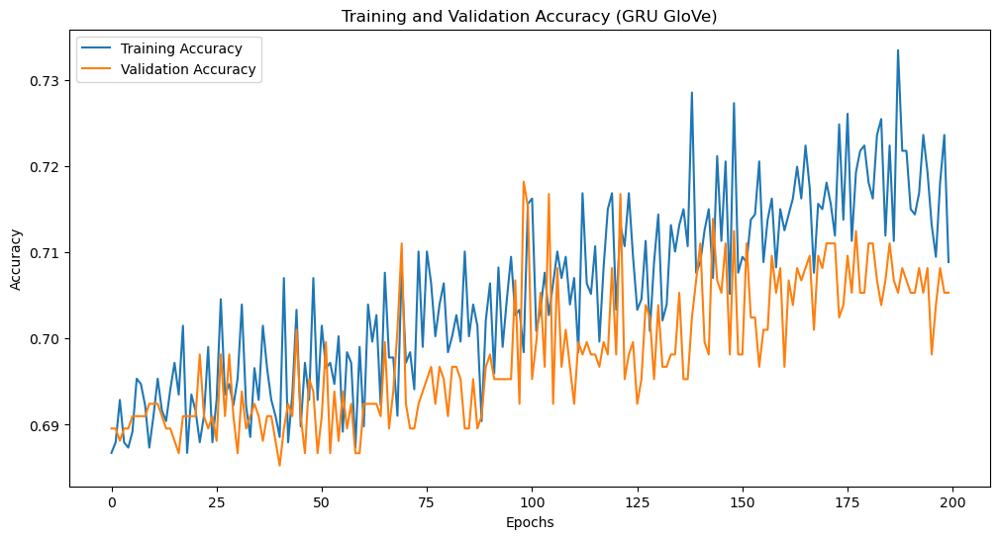

In [129]:
# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(history_gru_glove.history['accuracy'], label='Training Accuracy')
plt.plot(history_gru_glove.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy (GRU GloVe)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [130]:
# Evaluate on training set
train_loss_gru_glove, train_accuracy_gru_glove = model_gru_glove.evaluate(
    X_train_gru_glove, y_train_gru_glove, verbose=0
)

# Evaluate on test set
test_loss_gru_glove, test_accuracy_gru_glove = model_gru_glove.evaluate(
    X_test_gru_glove, y_test_gru_glove, verbose=0
)

# Print training and test accuracy
print("GRU GloVe Evaluation:")
print(f"Training Accuracy: {train_accuracy_gru_glove:.4f}")
print(f"Test Accuracy: {test_accuracy_gru_glove:.4f}")

# Store results in a DataFrame for comparison with other models
results_gru_glove = pd.DataFrame({
    'Model': ['GRU with GloVe'],
    'Training Accuracy': [train_accuracy_gru_glove],
    'Test Accuracy': [test_accuracy_gru_glove],
    'F1 Score': [f1_gru_glove]
})

print(results_gru_glove)

GRU GloVe Evaluation:
Training Accuracy: 0.7334
Test Accuracy: 0.7053
            Model  Training Accuracy  Test Accuracy  F1 Score
0  GRU with GloVe           0.733415       0.705293  0.615787


The **GRU model with GloVe embeddings** achieved a training accuracy of **73.34%** and a test accuracy of **70.53%**, with an F1 score of **0.6158**. The training and test accuracies are close, suggesting minimal overfitting.

**<span style="color: orange;">FastText Pre-Trained Model</span>**

In [ ]:
#!pip install gensim fasttext

In [ ]:
import urllib.request
import os
from gensim.models import KeyedVectors

def download_fasttext_model(url, dest_file):
    if not os.path.exists(dest_file):
        print(f"Downloading FastText embeddings from {url}...")
        urllib.request.urlretrieve(url, dest_file)
        print(f"Downloaded and saved to {dest_file}.")
    else:
        print(f"FastText file already exists at {dest_file}.")

# Replace with the desired FastText model URL
fasttext_url = "https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.en.300.vec.gz"
fasttext_path = "cc.en.300.vec.gz"

download_fasttext_model(fasttext_url, fasttext_path)

FastText file already exists at cc.en.300.vec.gz.


In [ ]:
# Step 2: Load FastText Model
print("Loading FastText model...")
fasttext_model = KeyedVectors.load_word2vec_format(fasttext_path, binary=False)

Loading FastText model...


In [ ]:
# Step 5: Example usage for the word "negotiation"
word = "negotiation"
if word in fasttext_model.key_to_index:
    print(f"Embedding for '{word}':\n{fasttext_model[word]}")
else:
    print(f"Word '{word}' not found in FastText model.")

Embedding for 'negotiation':
[-0.0114  0.0083  0.0364  0.0124 -0.0649  0.0203  0.0152 -0.1104 -0.0009
 -0.0115 -0.025   0.0439 -0.029  -0.0705 -0.0005  0.0121 -0.0205 -0.0403
  0.0293  0.0108  0.0087  0.0015  0.0145 -0.0218 -0.0003 -0.0343  0.0193
  0.0277  0.0712  0.0377 -0.0114  0.0291  0.0294 -0.0568  0.007   0.0408
  0.0448 -0.0019  0.002   0.05   -0.031  -0.0233  0.0443  0.0552 -0.0367
 -0.0061  0.0354  0.0307  0.0215 -0.0431  0.0061 -0.0265  0.0023 -0.0087
  0.0079  0.0174  0.0244  0.0006 -0.054  -0.0705 -0.0215 -0.0233 -0.0079
 -0.0096 -0.0156  0.0256  0.0045 -0.0049  0.0345  0.0503  0.0133  0.0187
 -0.0032 -0.0064  0.0181  0.0521 -0.0023  0.0076 -0.0182 -0.0247  0.0112
  0.0216 -0.0057  0.051   0.0209  0.0056  0.0245  0.0081  0.0543  0.037
  0.0332  0.0293  0.0055  0.0218 -0.0035  0.012  -0.0177 -0.0201 -0.0358
 -0.0413  0.0021  0.0261  0.0581  0.0086 -0.0078 -0.0523  0.031   0.0162
 -0.0026 -0.0519  0.0253  0.0106 -0.0208  0.01    0.0427  0.0536 -0.0063
  0.0357  0.0337  0.019

In [ ]:
# Find Most Similar Words
similar_words = fasttext_model.most_similar(word, topn=10)
print(f"Top 10 similar words to '{word}':")
for similar_word, similarity in similar_words:
    print(f"{similar_word}: {similarity:.4f}")


Top 10 similar words to 'negotiation':
negotation: 0.8197
negotiations: 0.8103
negotiating: 0.7998
negotations: 0.7033
pre-negotiation: 0.6955
negotiate: 0.6775
Negotiation: 0.6701
negotiated: 0.6648
negotiator: 0.6606
re-negotiation: 0.6556


In [ ]:
def get_word_embedding(word, model, embedding_dim):
    """
    Retrieve the embedding for a word. If the word is not in the vocabulary, return a zero vector.
    """
    if word in model.key_to_index:
        return model[word]
    else:
        return np.zeros(embedding_dim)  # Use zero vector for unknown words

def get_sentence_embedding(sentence, model, embedding_dim):
    """
    Compute the sentence embedding by averaging the word embeddings for all words in the sentence.
    """
    words = sentence.split()  # Tokenize sentence into words
    word_embeddings = [get_word_embedding(word, model, embedding_dim) for word in words]
    if word_embeddings:  # If the sentence has words
        return np.mean(word_embeddings, axis=0)  # Average the word embeddings
    else:
        return np.zeros(embedding_dim)  # Return zero vector for empty sentences


In [ ]:
# Step 6: Apply FastText embeddings to the dataframe
embedding_dim = fasttext_model.vector_size  # Dimension of FastText embeddings

# Ensure 'Content' column is cleaned and ready for embedding
df['Embedding'] = df['Content'].apply(lambda x: get_sentence_embedding(x, fasttext_model, embedding_dim))

# Step 7: Verify embeddings
print(f"Embedding shape for first row: {df['Embedding'].iloc[0].shape}")
print(df[['Content', 'Embedding']].head())

# Step 8: Save the embeddings to a file (optional)
df.to_pickle("df_with_fasttext_embeddings.pkl")

Embedding shape for first row: (300,)
                                             Content  \
0  dear mr mendel hope you are doing well as the ...   
1  dear mr novak thank you for reaching out to me...   
2  dear mr mendel thank your kind response – no n...   
3  dear mr novak thank you for your swift reply i...   
4  dear mr mendel thank you for your proposal and...   

                                           Embedding  
0  [-0.01888004759393772, -0.035708075838301476, ...  
1  [-0.017481098, -0.017697, -0.0069347927, 0.028...  
2  [-0.01694861474635431, -0.03919949598835608, -...  
3  [-0.012027027086778152, -0.008722221587893661,...  
4  [-0.011264883, -0.038419914, -0.008695534, 0.0...  


# LSTM

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input, Embedding
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
import numpy as np

# Separate features (embeddings) and target labels
X_lstm = np.stack(df['Embedding'].values)  # Convert list of embeddings to a NumPy array
y_lstm = df['NegoOutcomeLabel'].values  # Binary outcome labels (0 = Reject, 1 = Accept)

# Check the shapes of the feature matrix and target vector
print("Feature matrix shape:", X_lstm.shape)
print("Target vector shape:", y_lstm.shape)

# Train-Test Split
X_train_lstm, X_test_lstm, y_train_lstm, y_test_lstm = train_test_split(X_lstm, y_lstm, test_size=0.2, random_state=42)


Feature matrix shape: (2327, 300)
Target vector shape: (2327,)


In [ ]:
# Reshape input data for LSTM (LSTM expects 3D input: samples, timesteps, features)
timesteps = 1  # Sentence-level embeddings; single timestep
features = X_train_lstm.shape[1]  # Embedding dimension
X_train_lstm = X_train_lstm.reshape(X_train_lstm.shape[0], timesteps, features)
X_test_lstm = X_test_lstm.reshape(X_test_lstm.shape[0], timesteps, features)

# LSTM Model
model_lstm = Sequential([
    Input(shape=(timesteps, features)),  # Input layer
    LSTM(128, activation='tanh', return_sequences=False),  # LSTM layer
    Dropout(0.5),  # Regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Regularization
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

In [ ]:
# Exponential decay for learning rate
import tensorflow as tf
initial_learning_rate = 1e-3  # Initial learning rate
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,
    decay_rate=0.9,
    staircase=True
)

# AdamW optimizer with exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum
    beta_2=0.999,  # Adaptation to noisy gradients
    weight_decay=1e-5
)

# Compile the model
model_lstm.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Summary of the model
print(model_lstm.summary())

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                   │ (None, 128)            │       219,648 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 32)             │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 223,809 (874.25 KB)

 Trainable params: 223,809 (874.25 KB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
# Train the model
history_lstm = model_lstm.fit(X_train_lstm, np.array(y_train_lstm),
                              epochs=20, batch_size=32, validation_split=0.4,
                              validation_data=(X_test_lstm, np.array(y_test_lstm)))

# Evaluate the model
test_loss, test_accuracy = model_lstm.evaluate(X_test_lstm, y_test_lstm)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

# Predictions
y_pred_probs_lstm = model_lstm.predict(X_test_lstm)
y_pred_lstm = (y_pred_probs_lstm > 0.5).astype(int)

# Classification Report
print("Classification Report:")
print(classification_report(y_test_lstm, y_pred_lstm))

# Accuracy Score
accuracy = accuracy_score(y_test_lstm, y_pred_lstm)
print(f"Accuracy: {accuracy:.4f}")

Epoch 1/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6895 - loss: 0.6515 - val_accuracy: 0.6845 - val_loss: 0.6193
Epoch 2/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6972 - loss: 0.6109 - val_accuracy: 0.6845 - val_loss: 0.6167
Epoch 3/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6647 - loss: 0.6407 - val_accuracy: 0.6845 - val_loss: 0.6134
Epoch 4/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6789 - loss: 0.6249 - val_accuracy: 0.6845 - val_loss: 0.6101
Epoch 5/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6858 - loss: 0.6223 - val_accuracy: 0.6845 - val_loss: 0.6072
Epoch 6/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7002 - loss: 0.6069 - val_accuracy: 0.6845 - val_loss: 0.6023
Epoch 7/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6983 - loss: 0.6047 - val_accuracy: 0.6845 - val_loss: 0.5982
Epoch 8/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6864 - loss: 0.6072 - val_accuracy: 0.6845 - val_loss:

In [ ]:
# Evaluate on training set
train_loss, train_accuracy = model_lstm.evaluate(X_train_lstm, np.array(y_train_lstm), verbose=0)

# Evaluate on test set
test_loss, test_accuracy = model_lstm.evaluate(X_test_lstm, np.array(y_test_lstm), verbose=0)

# Print training and test accuracy
print("GRU Evaluation:")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")


GRU Evaluation:
Training Accuracy: 0.7297
Test Accuracy: 0.7275
